# PROJECT By Mandeep Singh Narang

# NOTE: We have used some interactive visualizations across the file that take time to load, hence please update path for the data files and rull all cells and wait for period of 3-5 mins for the kernel to load and finish

##  For our project we have used the following methodology:

### Step 1: Business Understanding i.e we have identified the goals of the project

### Step 2: Data Understanding & Preparation: understanding the data we are working with and performing appropriate data transformations

### Step 3: Modeling: What is the model we should use

### Step 4: Evaluation: Which model meets our objective or goal




## STEP 1 - Business Understanding / Identification of goals of the project

###  Our main objective is divided in to two parts:

### 1. Predict Audit Risk, i.e to build a model that accurately predicts the audit risk parameter before the audit team engages into the audit to provide an insight and prepare a robust audit plan  

### 2. Classify high risk and fradulent firms, we need to build a model that based on past and current measures of risk and other parameters helps the audit team to indentify high risk and fraudulent firms 

### In terms of machine learning to obtain the above objectives we have classified the problem into following parts:

### 1.Regression Problem: To build a prediction model to predict Audit Risk

### 2.Classification Problem: To identify or classify different firms into risky or non-risky categories

## STEP 2 - Data Understanding & Preparation

### We have two datasets namely 'Auditrisk.csv' and 'Trial.csv' both containing present and historical risk factors of different firms in this sections we review the data in order to understand the data better to be able to perform appropriate data transformations

In [1]:
path_ar = 'audit_risk.csv'
path_trial = 'trial.csv'

In [2]:
import mglearn
import pydotplus
from graphviz import Source

In [3]:
# Set full screen mode
from IPython.core.display import display, HTML
display(HTML('<style>.container { width:100% !important; }</style>'))
        
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ipywidgets import widgets, interactive
from ipykernel.pylab.backend_inline import flush_figures

import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.linear_model import SGDRegressor
from  sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from  sklearn.linear_model import Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier

from sklearn import tree
from IPython.display import SVG
from sklearn.tree import export_graphviz

from IPython.display import Image
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from pandas.plotting import scatter_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

In [4]:
#Reading Trial Data file
df_trail = pd.read_csv(path_trial)
df_trail.info() # checking basic info of the data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 776 entries, 0 to 775
Data columns (total 18 columns):
Sector_score     776 non-null float64
LOCATION_ID      776 non-null object
PARA_A           776 non-null float64
SCORE_A          776 non-null int64
PARA_B           776 non-null float64
SCORE_B          776 non-null int64
TOTAL            776 non-null float64
numbers          776 non-null float64
Marks            776 non-null int64
Money_Value      775 non-null float64
MONEY_Marks      776 non-null int64
District         776 non-null int64
Loss             776 non-null int64
LOSS_SCORE       776 non-null int64
History          776 non-null int64
History_score    776 non-null int64
Score            776 non-null float64
Risk             776 non-null int64
dtypes: float64(7), int64(10), object(1)
memory usage: 109.2+ KB


### There is only one null Value in 'Money_Value' column, also we may have to look into the fields with data type object

In [5]:
#Reading audit_risk data file
df_ar = pd.read_csv(path_ar)
df_ar.info() # checking basic info of the data
#Marks,MONEY_Marks,LOSS_SCORE,History_score

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 776 entries, 0 to 775
Data columns (total 27 columns):
Sector_score      776 non-null float64
LOCATION_ID       776 non-null object
PARA_A            776 non-null float64
Score_A           776 non-null float64
Risk_A            776 non-null float64
PARA_B            776 non-null float64
Score_B           776 non-null float64
Risk_B            776 non-null float64
TOTAL             776 non-null float64
numbers           776 non-null float64
Score_B.1         776 non-null float64
Risk_C            776 non-null float64
Money_Value       775 non-null float64
Score_MV          776 non-null float64
Risk_D            776 non-null float64
District_Loss     776 non-null int64
PROB              776 non-null float64
RiSk_E            776 non-null float64
History           776 non-null int64
Prob              776 non-null float64
Risk_F            776 non-null float64
Score             776 non-null float64
Inherent_Risk     776 non-null float64
CON

### There is only one null Value in 'Money_Value' column, also we may have to look into the fields with data type object

In [6]:
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_columns', None)
display(df_ar.head(2))

,Sector_score,LOCATION_ID,PARA_A,Score_A,Risk_A,PARA_B,Score_B,Risk_B,TOTAL,numbers,Score_B.1,Risk_C,Money_Value,Score_MV,Risk_D,District_Loss,PROB,RiSk_E,History,Prob,Risk_F,Score,Inherent_Risk,CONTROL_RISK,Detection_Risk,Audit_Risk,Risk
0,3.89,23,4.18,0.6,2.508,2.50,0.2,0.500,6.68,5.0,0.2,1.0,3.38,0.2,0.676,2,0.2,0.4,0,0.2,0.0,2.4,8.574,0.4,0.5,1.7148,1
1,3.89,6,0.00,0.2,0.000,4.83,0.2,0.966,4.83,5.0,0.2,1.0,0.94,0.2,0.188,2,0.2,0.4,0,0.2,0.0,2.0,2.554,0.4,0.5,0.5108,0


In [7]:
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_columns', None)
display(df_trail.head(2))

,Sector_score,LOCATION_ID,PARA_A,SCORE_A,PARA_B,SCORE_B,TOTAL,numbers,Marks,Money_Value,MONEY_Marks,District,Loss,LOSS_SCORE,History,History_score,Score,Risk
0,3.89,23,4.18,6,2.50,2,6.68,5.0,2,3.38,2,2,0,2,0,2,2.4,1
1,3.89,6,0.00,2,4.83,2,4.83,5.0,2,0.94,2,2,0,2,0,2,2.0,0


### On our analysis of both the datasets above we have identified the following:

### 1. Missing Values
### 2. There are some columns that are present in 'trail.csv' that are not present in 'auditrisk.csv' 
### 3. All columns comprise of different risk factors along with their probability, there are some columns that might not be important for our analysis


## Merging both datasets


### Comparing both the datasets we can see that 'trail.csv' contains the following columns that are not present in auditrisk.csv : Marks, Money Marks, Loss Score, History Score & Loss

In [8]:
df_ar = pd.concat([df_ar,df_trail[['Marks','MONEY_Marks','LOSS_SCORE','History_score','Loss']]],axis = 1)
# df_arx.info()

## Imputation of values with mean

In [9]:
#Money_value has a null value can be imputed as mean of the column

df_ar.Money_Value.describe()


count    775.000000
mean     14.137631 
std      66.606519 
min      0.000000  
25%      0.000000  
50%      0.090000  
75%      5.595000  
max      935.030000
Name: Money_Value, dtype: float64

In [10]:
df_ar.Money_Value[df_ar.Money_Value.isnull() == True] =14.15

## Analysis of Redundant Features

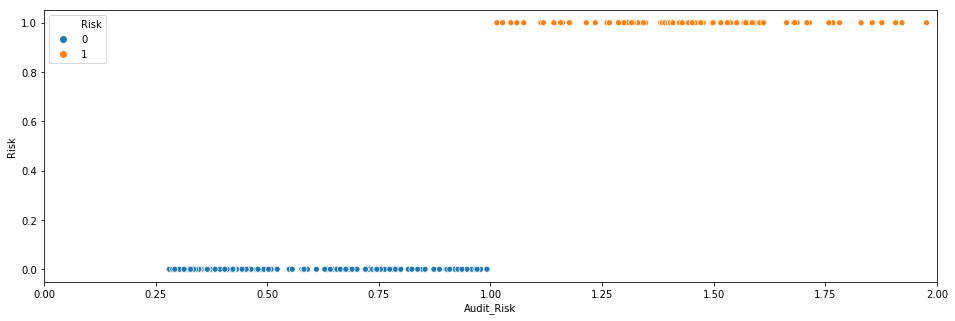

In [11]:
#Lets remove some redundant features
#Risk Can be dropped as it is drived by Audit_Risk itself by labeling Risk 1 @ Audit_risk>=1
#Location_Id can Be dropped
plt.figure(figsize = (16,5))
sns.scatterplot(x="Audit_Risk", y="Risk",hue = 'Risk', data=df_ar)
plt.xlim(0,2)
plt.plot
df_ar_cleaned = df_ar.drop(['Risk','LOCATION_ID'],axis = 1)

### Risk is a binary label which is not required for our regression analysis, further it is derived by Audit_Risk itself

### Location_Id similarly can be dropped 

In [12]:
## Distribution Plots 
Feature= widgets.Dropdown(options= list(df_ar.drop(['Risk','LOCATION_ID'],axis = 1).columns))
Plot_Type= widgets.RadioButtons(options= ['Distribution Plot','Box Plot'])

def plotit(Feature,Plot_Type):                            
    
    %matplotlib inline
    plt.figure(figsize = (16,5))
    if Plot_Type == 'Distribution Plot':
        sns.distplot(df_ar.drop(['Risk','LOCATION_ID'],axis = 1)[Feature])    
        plt.ylabel('freq')
        plt.title(Feature +' : Distribution')

    elif Plot_Type == 'Box Plot':
        sns.boxplot(x=df_ar.drop(['Risk','LOCATION_ID'],axis = 1)[Feature])    
        plt.title(Feature +' : Box Plot')
    flush_figures()
                            
interactive(plotit, Feature=Feature,Plot_Type=Plot_Type)

interactive(children=(Dropdown(description='Feature', options=('Sector_score', 'PARA_A', 'Score_A', 'Risk_A', …

### Above we have created distribution plots to visualize the distribution of each feature in order to understand its effect  
### We can clearly see that 'Detection_Risk' variable has a constant value of 0.5 and has no variance hence can be dropped

In [13]:
df_ar_cleaned = df_ar_cleaned.drop('Detection_Risk',axis = 1)

In [14]:
#Lets see the scatter plots

Select_X= widgets.Dropdown(options= list(df_ar.drop(['Risk','LOCATION_ID'],axis = 1).columns))
Select_Y= widgets.Dropdown(options= list(df_ar.drop(['Risk','LOCATION_ID'],axis = 1).columns))

def plotit_regplt(Select_X,Select_Y):
    plt.figure(figsize = (16,5))
    sns.regplot(x=Select_X, y=(Select_Y),data=df_ar.drop(['Risk','LOCATION_ID'],axis = 1))
    flush_figures()
interactive(plotit_regplt, Select_X=Select_X,Select_Y=Select_Y)


interactive(children=(Dropdown(description='Select_X', options=('Sector_score', 'PARA_A', 'Score_A', 'Risk_A',…

### Features with high correlation are more linearly dependent and hence have almost the same effect on the dependent variable, plus when two features have high correlation it leads to the problem of multicollinearity, hence in this section we aim to identify feature with high correlations which may lead to bad model predictions, here we perform 2 steps:

### 1. Identification of highly correlated features with help of a correlation matrix

### 2. Remove features with correlation of 0.9 or more



In [15]:
df_ar_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 776 entries, 0 to 775
Data columns (total 29 columns):
Sector_score     776 non-null float64
PARA_A           776 non-null float64
Score_A          776 non-null float64
Risk_A           776 non-null float64
PARA_B           776 non-null float64
Score_B          776 non-null float64
Risk_B           776 non-null float64
TOTAL            776 non-null float64
numbers          776 non-null float64
Score_B.1        776 non-null float64
Risk_C           776 non-null float64
Money_Value      776 non-null float64
Score_MV         776 non-null float64
Risk_D           776 non-null float64
District_Loss    776 non-null int64
PROB             776 non-null float64
RiSk_E           776 non-null float64
History          776 non-null int64
Prob             776 non-null float64
Risk_F           776 non-null float64
Score            776 non-null float64
Inherent_Risk    776 non-null float64
CONTROL_RISK     776 non-null float64
Audit_Risk       776 non-

In [16]:
corr =df_ar_cleaned.drop('Audit_Risk',axis = 1).corr()

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "10pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "10pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '25pt')])]
cmap=sns.diverging_palette(5, 250, as_cmap=True)


df_ar_cleaned.corr().style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '100px', 'font-size': '9pt'})\
    .set_caption("Hover to magnify")\
    .set_precision(2)\
    .set_table_styles(magnify())

### Next, we compare the correlation between features and remove one of two features that have a correlation higher than 0.9

In [17]:
# Sector_score,PARA_A,PARA_B,numbers,Money_Value,District_Loss,History,LOSS_SCORE
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >=0.9:
            if columns[j]:
                columns[j] = False
selected_columns = df_ar_cleaned.drop('Audit_Risk',axis = 1).columns[columns]
df_ar_cleaned_1 = df_ar_cleaned.drop('Audit_Risk',axis = 1)[selected_columns]
df_ar_cleaned_1.head()

,Sector_score,PARA_A,Score_A,PARA_B,Score_B,numbers,Money_Value,Score_MV,District_Loss,PROB,History,Prob,Inherent_Risk,CONTROL_RISK
0,3.89,4.18,0.6,2.50,0.2,5.0,3.38,0.2,2,0.2,0,0.2,8.574,0.4
1,3.89,0.00,0.2,4.83,0.2,5.0,0.94,0.2,2,0.2,0,0.2,2.554,0.4
2,3.89,0.51,0.2,0.23,0.2,5.0,0.00,0.2,2,0.2,0,0.2,1.548,0.4
3,3.89,0.00,0.2,10.80,0.6,6.0,11.75,0.6,2,0.2,0,0.2,17.530,0.4
4,3.89,0.00,0.2,0.08,0.2,5.0,0.00,0.2,2,0.2,0,0.2,1.416,0.4


In [18]:
list(df_ar_cleaned_1.columns)

['Sector_score',
 'PARA_A',
 'Score_A',
 'PARA_B',
 'Score_B',
 'numbers',
 'Money_Value',
 'Score_MV',
 'District_Loss',
 'PROB',
 'History',
 'Prob',
 'Inherent_Risk',
 'CONTROL_RISK']

### On viewing the correlation matrix it is clear that there is multicolinearity between many variables, so we can drop either one of the features in order to make a better prediction model

In [19]:
df_ar_cleaned_1.describe()

,Sector_score,PARA_A,Score_A,PARA_B,Score_B,numbers,Money_Value,Score_MV,District_Loss,PROB,History,Prob,Inherent_Risk,CONTROL_RISK
count,776.000000,776.000000,776.000000,776.000000,776.000000,776.000000,776.000000,776.000000,776.000000,776.000000,776.000000,776.000000,776.000000,776.000000
mean,20.184536,2.450194,0.351289,10.799988,0.313144,5.067655,14.137647,0.290979,2.505155,0.206186,0.104381,0.216753,17.680612,0.572680
std,24.319017,5.678870,0.174055,50.083624,0.169804,0.264449,66.563533,0.159745,1.228678,0.037508,0.531031,0.067987,54.740244,0.444581
min,1.850000,0.000000,0.200000,0.000000,0.200000,5.000000,0.000000,0.200000,2.000000,0.200000,0.000000,0.200000,1.400000,0.400000
25%,2.370000,0.210000,0.200000,0.000000,0.200000,5.000000,0.000000,0.200000,2.000000,0.200000,0.000000,0.200000,1.583500,0.400000
50%,3.890000,0.875000,0.200000,0.405000,0.200000,5.000000,0.095000,0.200000,2.000000,0.200000,0.000000,0.200000,2.214000,0.400000
75%,55.570000,2.480000,0.600000,4.160000,0.400000,5.000000,5.630000,0.400000,2.000000,0.200000,0.000000,0.200000,10.663500,0.400000
max,59.850000,85.000000,0.600000,1264.630000,0.600000,9.000000,935.030000,0.600000,6.000000,0.600000,9.000000,0.600000,801.262000,5.800000


Outlier Treatment - we can see from above box plot, scatter Visualizations and description table that data has outliers, but because of the lack of domain knoweldge we can not risk dropping any value. The outlier we see may be the actual values.

### DATA TRANSFORMATION 

### 1.Split the data into Train and Test data

### 2.Scale - For scaling we are going to use StandardScaler scaling method. Our data has some outliers and on removing those outliers we lose a significant amount of data so by using Standard Scaler method we can bring the data near to the normal curve. It removes the mean and scales the data to unit variance. However, the outliers have an influence when computing the empirical mean and standard deviation.

### As the outliers on each feature have different magnitudes, the spread of the transformed data on each feature is very different

### Standard Scaler:
### - fit will find mean and std() for each column
### - transform x = (x - mean)/std
### - it is going to chnage the distance between the points
### - not between 0 and 1 but the numbers will be on normal curve

In [20]:
X  = df_ar_cleaned_1
y  = df_ar_cleaned.Audit_Risk

#Spliting the data into train and test sets
X_train_org, X_test_org, y_train, y_test = train_test_split(X, y, random_state=0)

scaler = StandardScaler()
scaler.fit(X_train_org)
X_train = scaler.transform(X_train_org)
X_test = scaler.transform(X_test_org)

print("Size of training set: {}      size of test set:"
      " {}\n".format(X_train.shape[0], X_test.shape[0]))

Size of training set: 582      size of test set: 194



In [21]:
(X.columns)

Index(['Sector_score', 'PARA_A', 'Score_A', 'PARA_B', 'Score_B', 'numbers',
       'Money_Value', 'Score_MV', 'District_Loss', 'PROB', 'History', 'Prob',
       'Inherent_Risk', 'CONTROL_RISK'],
      dtype='object')

### Now since we are done with data understanding, preparations and transformation we will begin with step 3 i.e Data Modeling


# Step 3 - Modeling - Regression

### - In modeling our data our approach will be two-fold:

### 1. We will use the training data to train our model along with cross validation to tune various hyper parameters in the model

### 2. Then we will use those parameters and the best model to predict our test data score

###  Regression Models that we would implement are:

### - LinearRegression
### - Polynomial Regression
### - SGDRegressor
### - Ridge Regression
### - Lasso Regression
### - KNN Regressor
### - LinearSVR 
### - SVR - Kernel : rbf, poly
### - Decision Tree Regressor

## Linear Regression

In [22]:
lreg = LinearRegression()
lreg.fit(X_train,y_train)
print('Train score: %.4f'%lreg.score(X_train,y_train))

Train score: 0.8158


### Let us now review the model cross validation scores to see the model performance

In [23]:
scores = cross_val_score(lreg, X_train,y_train,cv = 5)
print("Cross-validation scores: {}".format(scores))
print("Average cross-validation score: {:.2f}".format(scores.mean()))

Cross-validation scores: [ 0.69127682  0.78620652  0.80135374 -1.03174545  0.82448611]
Average cross-validation score: 0.41


### Scores are fluctuating, reason may be the less amount of data or outliers in the Data, lets try K fold with 10 folds

In [24]:
kfold = KFold(n_splits=10)
print("Cross-validation scores:\n{}".format(cross_val_score(lreg, X_train, y_train, cv=kfold)))
print("Average cross-validation score: {:.2f}".format(cross_val_score(lreg, X_train, y_train, cv=kfold).mean()))

Cross-validation scores:
[ 0.81073884  0.65904797  0.80403245  0.78485994  0.78394575  0.70911379
  0.57161704 -3.19488178  0.87057811  0.80685028]
Average cross-validation score: 0.36


In [25]:
#lets try the model on test data
print('Test score: %.4f'%lreg.score(X_test,y_test))

Test score: 0.4210


In [26]:
f = open('Audit_risk_regg_result.csv','w')#append the lines into the file
line = 'LinearRegression,,'  +str(lreg.score(X_train,y_train)) + ',' + str(lreg.score(X_test, y_test)) + '\n'
f.write(line)
f.close()


### Lets see some visualizations of the model effect on train and test data

In [27]:
def reg_indvidual_plot(regfunc,column_number,data_train,y_train,data_test,y_test,x_lable,y_lable):
    #plotting regression with single variable
    X_train_dp = data_train[:,column_number].reshape(-1,1)
    X_test_dp = data_test[:,column_number].reshape(-1,1)
   
    regfunc.fit(X_train_dp, y_train)
    y_predict_train = regfunc.predict(X_train_dp)
    y_predict_test = regfunc.predict(X_test_dp)
    plt.figure(figsize = (20,5))
    plt.subplot(1,2,1)
    plt.plot(X_train_dp, y_predict_train, c = 'r')
    plt.scatter(X_train_dp,y_train)
    plt.xlabel(x_lable,fontsize=16)
    plt.ylabel(y_lable,fontsize=16)
    plt.title('Train data prediction',fontsize=16)
    
    plt.subplot(1,2,2)
    plt.plot(X_test_dp, y_predict_test, c = 'r')
    plt.scatter(X_test_dp,y_test)
    plt.xlabel(x_lable,fontsize=16)
    plt.ylabel(y_lable,fontsize=16)
    plt.title('Test data prediction',fontsize=16)
    plt.tight_layout()
    plt.show()

In [28]:
column_list={}
i = 0
for x in list(X_train_org.columns):
    
    if x not in column_list:
        column_list[x] = i
        i=i+1

In [29]:
#Linear Regg plot
Variable = widgets.Dropdown(options= list(X_train_org.columns))

def plot_lreg(Variable):
    key = Variable
    value = column_list[key]
    reg_indvidual_plot(lreg,value,X_train,y_train,X_test,y_test,key,'Audit_Risk')    

interactive(plot_lreg, Variable=Variable)

interactive(children=(Dropdown(description='Variable', options=('Sector_score', 'PARA_A', 'Score_A', 'PARA_B',…

### Based on above it seems that the Model is overfitting the data , also we can clearly see by the -ve scores that there are some specific entries that are not exlained by model. Our best score is 0.81 for train set and 0.41 for test set

### lets try some advanced model to explain those entries too.

## SGD Regressor

In [30]:
iter_list = [100,500,1000,3000,5000,8000,10000]
train_l1 = []
valid_l1 = []
train_l2 = []
valid_l2 = []


for max_iter in iter_list:
    #create the model 
    sgd_l1 = SGDRegressor(max_iter=max_iter,penalty='l1',random_state= 0)
    sgd_l2 = SGDRegressor(max_iter=max_iter,penalty='l2',random_state= 0)
    
    #train the model
    sgd_l1.fit(X_train,y_train)
    sgd_l2.fit(X_train,y_train)
    
    #evaluate the model
    scores1 = cross_val_score(sgd_l1, X_train,y_train,cv = 5)
    scores2 = cross_val_score(sgd_l2, X_train,y_train,cv = 5)
    print("Average cross-validation score with L1: {:.2f}".format(scores1.mean()))
    print("Average cross-validation score with L2: {:.2f}".format(scores2.mean()))
    train_l1.append(sgd_l1.score(X_train,y_train))
    valid_l1.append(scores1.mean())
    train_l2.append(sgd_l2.score(X_train,y_train))
    valid_l2.append(scores2.mean())

Average cross-validation score with L1: 0.42
Average cross-validation score with L2: 0.42
Average cross-validation score with L1: 0.41
Average cross-validation score with L2: 0.41
Average cross-validation score with L1: 0.41
Average cross-validation score with L2: 0.41
Average cross-validation score with L1: 0.41
Average cross-validation score with L2: 0.41
Average cross-validation score with L1: 0.42
Average cross-validation score with L2: 0.42
Average cross-validation score with L1: 0.41
Average cross-validation score with L2: 0.41
Average cross-validation score with L1: 0.42
Average cross-validation score with L2: 0.42


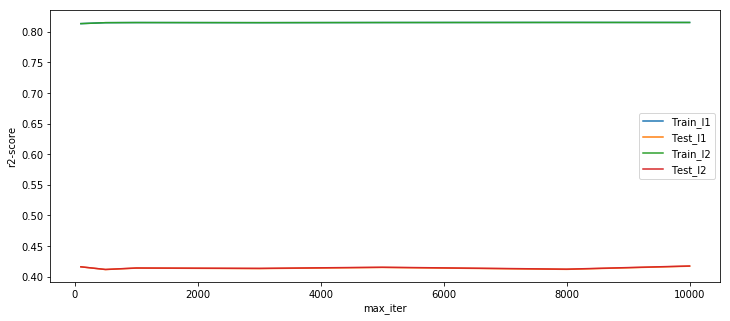

In [31]:
%matplotlib inline
plt.figure(figsize = (12,5))

plt.plot(iter_list,train_l1,label = 'Train_l1')
plt.plot(iter_list,valid_l1,label = 'Test_l1')
plt.plot(iter_list,train_l2,label = 'Train_l2')
plt.plot(iter_list,valid_l2,label = 'Test_l2')
plt.xlabel('max_iter')
plt.ylabel('r2-score')
plt.legend()
plt.show()

In [32]:
#Scores on test data
sgd_l1 = SGDRegressor(max_iter=1000,penalty='l1',random_state= 0)
sgd_l1.fit(X_train,y_train)


print(sgd_l1.score(X_train,y_train))
print(sgd_l1.score(X_test,y_test))
    

0.8151790213931165
0.42418755628136373


In [33]:
f = open('Audit_risk_regg_result.csv','a')#append the lines into the file
line = 'SGDRegressor,maxiter = 5000,'  +str(sgd_l1.score(X_train,y_train)) + ',' + str(sgd_l1.score(X_test, y_test)) + '\n'
f.write(line)
f.close()



### It looks like data is not able to explain or generalize based on our SGD model, our best test and train score is of 0.42 and 0.81 respectively, next we would try to use some form of regularization model to see if it improves our prediction

## Ridge Regression
   

In [34]:
#lets try default ridge model first

ridge= Ridge()
ridge.fit(X_train, y_train)

train_score = ridge.score(X_train, y_train)
print("Train score : {:.2f}".format(train_score))

scores = cross_val_score(ridge, X_train,y_train,cv = 5)
print("Cross-validation scores: {}".format(scores))
print("Average cross-validation score: {:.2f}".format(scores.mean()))



Train score : 0.82
Cross-validation scores: [ 0.69768692  0.78387008  0.80246699 -1.02227628  0.82388535]
Average cross-validation score: 0.42


### On default ridge model we get a Train Score or 0.82 and Average Cross Validation Score of 0.42, next we will perform gridsearch to identify the best parameter in order to improve these scores  

In [35]:
# we will use grid search to find best parameter for ridge regression
param_grid = {'alpha': [0.01, 0.1, 1, 10, 100,1000,3000,10000]}
print("Parameter grid:\n{}".format(param_grid))

Parameter grid:
{'alpha': [0.01, 0.1, 1, 10, 100, 1000, 3000, 10000]}


In [36]:
grid_search = GridSearchCV(Ridge(), param_grid, cv=5, return_train_score=True)
grid_search.fit(X_train, y_train)
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))

Best parameters: {'alpha': 1000}
Best cross-validation score: 0.63


In [37]:
results = pd.DataFrame(grid_search.cv_results_)
df = results[['mean_test_score','mean_train_score','param_alpha']]
df

,mean_test_score,mean_train_score,param_alpha
0,0.414756,0.824685,0.01
1,0.413059,0.824498,0.1
2,0.418239,0.824107,1
3,0.444476,0.822288,10
4,0.528177,0.810741,100
5,0.633183,0.673929,1000
6,0.498101,0.473164,3000
7,0.246006,0.226121,10000


### On implementing grid search we can clearly see that at alpha value of 1000 we have the best train and test score 

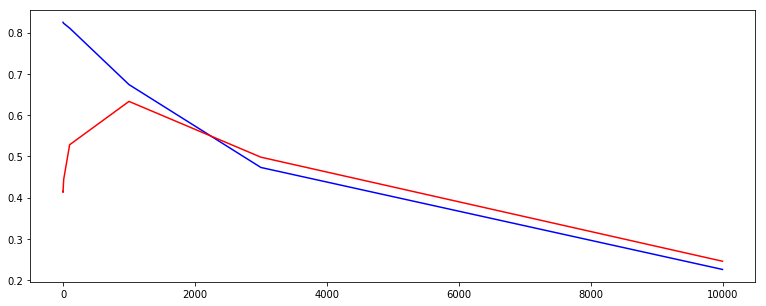

In [38]:
plt.figure(figsize=(13,5))
plt.plot(df.param_alpha,df.mean_train_score,label = 'Train',c = 'b')
plt.plot(df.param_alpha,df.mean_test_score,label = 'Train',c = 'r')
plt.show()

### we improved a little but lets see how this model generalizes our test data with the best parameter

In [39]:
ridge= Ridge(1000)
ridge.fit(X_train, y_train)
test_score = ridge.score(X_test, y_test)
print("Train set score with best parameters: {:.2f}".format(ridge.score(X_train, y_train)))
print("Test set score with best parameters: {:.2f}".format(test_score))

Train set score with best parameters: 0.70
Test set score with best parameters: 0.28


In [40]:
f = open('Audit_risk_regg_result.csv','a')#append the lines into the file
line = 'Ride,alpha = 1000,'  +str(ridge.score(X_train,y_train)) + ',' + str(ridge.score(X_test, y_test)) + '\n'
f.write(line)
f.close()

### Even at the best parameter we have a very low test score of 0.28 and train score of 0.70

## Lasso Regression

### Performing Gridsearch to select the best parameter

In [41]:
param_grid = {'alpha': [0.01, 0.1, 1, 10, 100,1000,3000]}
print("Parameter grid:\n{}".format(param_grid))

Parameter grid:
{'alpha': [0.01, 0.1, 1, 10, 100, 1000, 3000]}


In [42]:
lasso= Lasso()
lasso.fit(X_train, y_train)

grid_search = GridSearchCV(lasso, param_grid, cv=5, return_train_score=True)
grid_search.fit(X_train, y_train)
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))

Best parameters: {'alpha': 1}
Best cross-validation score: 0.60


In [43]:
results = pd.DataFrame(grid_search.cv_results_)
df = results[['mean_test_score','mean_train_score','param_alpha']]
df

,mean_test_score,mean_train_score,param_alpha
0,0.416250,0.824235,0.01
1,0.464486,0.821425,0.1
2,0.597424,0.801761,1
3,0.174326,0.191439,10
4,-0.019607,0.000000,100
5,-0.019607,0.000000,1000
6,-0.019607,0.000000,3000


### Based on the above results we can clearly see that our best parameter is at alpha =1 with cross val score of 0.60 

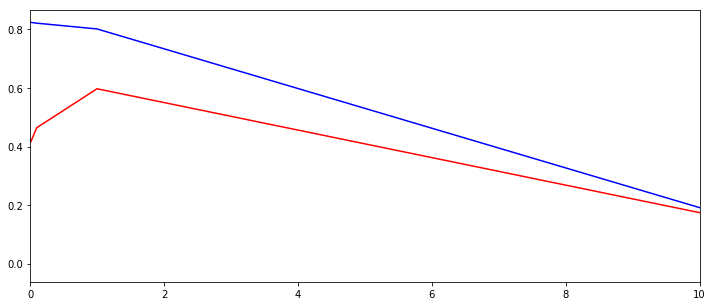

In [44]:
plt.figure(figsize = (12,5))
plt.plot(df.param_alpha,df.mean_train_score,label = 'Train',c = 'b')
plt.plot(df.param_alpha,df.mean_test_score,label = 'Train',c = 'r')
plt.xlim(0,10)
plt.show()



In [45]:
#Best Parameter scores
lasso= Lasso(1)
lasso.fit(X_train, y_train)
test_score = lasso.score(X_test, y_test)
print("Train set score with best parameters: {:.2f}".format(lasso.score(X_train, y_train)))
print("Test set score with best parameters: {:.2f}".format(test_score))

Train set score with best parameters: 0.79
Test set score with best parameters: 0.40


In [46]:
f = open('Audit_risk_regg_result.csv','a')#append the lines into the file
line = 'Laso,alpha = 1,'  +str(lasso.score(X_train,y_train)) + ',' + str(lasso.score(X_test, y_test)) + '\n'
f.write(line)
f.close()

### we can see that the model is overfitting lets try to reduce feature and use only imp features to regularize the model

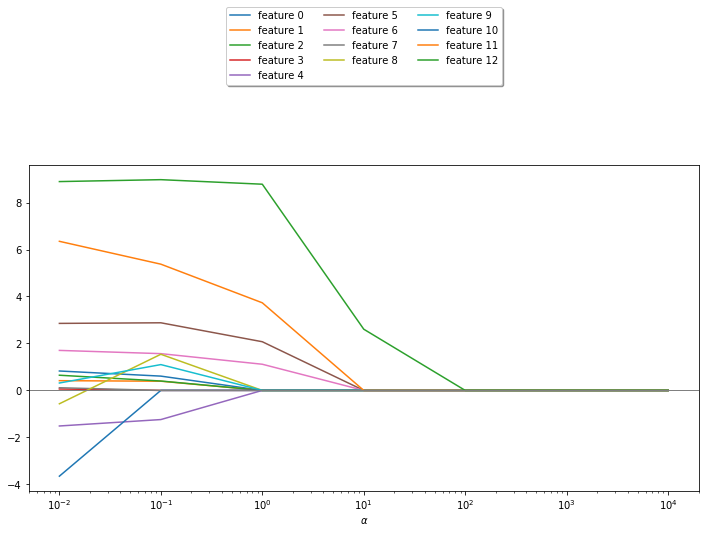

['Sector_score', 'PARA_A', 'Score_A', 'PARA_B', 'Score_B', 'numbers', 'Money_Value', 'Score_MV', 'District_Loss', 'PROB', 'History', 'Prob', 'Inherent_Risk', 'CONTROL_RISK']


In [47]:
#Feature importance by LASO
x_range = [0.01, 0.1, 1, 10, 100,1000,3000,5000,8000,10000]
coeff = []

for alpha in x_range: 
    lasso = Lasso(alpha)
    lasso.fit(X_train,y_train)
    coeff.append(lasso.coef_ )
    
coeff = np.array(coeff)
plt.figure(figsize = (12,6))
for i in range(0,13):
    plt.plot(x_range, coeff[:,i], label = 'feature {:d}'.format(i))

plt.axhline(y=0, xmin=0.001, xmax=99999, linewidth=1, c ='gray')
plt.xlabel(r'$\alpha$')
plt.xscale('log')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.5),
          ncol=3, fancybox=True, shadow=True)
plt.show()
print(list(X.columns))

### From the above chart we can clearly see that there are 4 features that are most important and our data is overfitting because of many other redundant features

### We also noticed that no linear model is performing well with the data, so lets try some more complex models and see if they are able to generalize better

## Polynomial Regression

### We start our analysis with a  degree '2' for polynomial regression and review the results

In [48]:
plreg = LinearRegression()

In [49]:
poly = PolynomialFeatures(2)
X_train_poly = poly.fit_transform(X_train)#preparing the variables for the regression as per the degree n
plreg.fit(X_train_poly, y_train)#linear regression on polynomial data
print(plreg.score(X_train_poly, y_train))#Appending the polynomial scores to the linear scores

1.0


In [50]:
scores = cross_val_score(plreg, X_train_poly,y_train,cv = 5)
print("Cross-validation scores: {}".format(scores))
print("Average cross-validation score: {:.2f}".format(scores.mean()))

Cross-validation scores: [0.99907975 0.99989176 0.99254419 0.54020764 0.99523378]
Average cross-validation score: 0.91


### This result is unexpected, It implies that by using some higher degree of the features there might be a data leakage, lets see the data again and try to choose some significant features

### Due to the above results we conducted some research to get better knowledge about our variables and understand their relationship pertaining to the audit domain  

In [51]:
df_ar_cleaned.head()

,Sector_score,PARA_A,Score_A,Risk_A,PARA_B,Score_B,Risk_B,TOTAL,numbers,Score_B.1,Risk_C,Money_Value,Score_MV,Risk_D,District_Loss,PROB,RiSk_E,History,Prob,Risk_F,Score,Inherent_Risk,CONTROL_RISK,Audit_Risk,Marks,MONEY_Marks,LOSS_SCORE,History_score,Loss
0,3.89,4.18,0.6,2.508,2.50,0.2,0.500,6.68,5.0,0.2,1.0,3.38,0.2,0.676,2,0.2,0.4,0,0.2,0.0,2.4,8.574,0.4,1.7148,2,2,2,2,0
1,3.89,0.00,0.2,0.000,4.83,0.2,0.966,4.83,5.0,0.2,1.0,0.94,0.2,0.188,2,0.2,0.4,0,0.2,0.0,2.0,2.554,0.4,0.5108,2,2,2,2,0
2,3.89,0.51,0.2,0.102,0.23,0.2,0.046,0.74,5.0,0.2,1.0,0.00,0.2,0.000,2,0.2,0.4,0,0.2,0.0,2.0,1.548,0.4,0.3096,2,2,2,2,0
3,3.89,0.00,0.2,0.000,10.80,0.6,6.480,10.80,6.0,0.6,3.6,11.75,0.6,7.050,2,0.2,0.4,0,0.2,0.0,4.4,17.530,0.4,3.5060,6,6,2,2,0
4,3.89,0.00,0.2,0.000,0.08,0.2,0.016,0.08,5.0,0.2,1.0,0.00,0.2,0.000,2,0.2,0.4,0,0.2,0.0,2.0,1.416,0.4,0.2832,2,2,2,2,0


### On conducting our domain reseach and data pattern findings we found that there are many features in the data that are derived from some other features and our output (Audit risk) is also derived by multiplication of some of the variables.

### Based on our analysis we found the following relationships between different variables:

 - PARA_A * Score_A = Risk_A
 - PARA_B * Score_B = Risk_B
 - PARA_A + PARA_B = Total
 - numbers * Score_B.1 = Risk_C
 - Money_Value * Score_MV = Risk_D
 - District_Loss * Prob = Risk_E
 - History * Prob = Risk_F
 - inherent_Risk =  Total of all the Risks
 
 - Score_A... = All of the Scores are weights given to specific parameter for a particular sector, we can clarify that in the Scatter plot above in the data exploration section.
 - Score = Total of all the scores
 - Control_Risk = constant Value given to the sectors 
 - Audit Risk = inherent risk * control risk * detection risk
 
### Based on the research and analysis above we can clearly see that a lot of features are a derivation of some other features that we can call base features, hence it makes sense to use only those features that are not derived by any of the other feature i.e our base features.
### Also on of the motivations to implement Machine Learning is to reduce manual work and use automation, if we see the data, our audit team has done a lot of hard work to calculate some of the derived features so we should reduce the team hardwork by implementing only basic features and let ML do remaining required work. 
 
### Also it makes sense to drop the variable 'scores' as these are weights given to diff sectors based on various risks and base features, we will leave that to our model to figure out based on the base features.


### Let us now see the polynomial regression results on new feature list i.e taking base features that are not derivation of any other variable namely: 

### Sector_score,Para_A,Para_B,numbers,Money_Value,District_Loss,Prob,History & Prob

In [52]:
feature_list = ['Sector_score','PARA_A','PARA_B','numbers','Money_Value','District_Loss','PROB','History','Prob']

In [53]:
X = X[feature_list]
corr =X.corr()

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "10pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "10pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '25pt')])]
cmap=sns.diverging_palette(5, 250, as_cmap=True)


X.corr().style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '100px', 'font-size': '9pt'})\
    .set_caption("Hover to magnify")\
    .set_precision(2)\
    .set_table_styles(magnify())

,Sector_score,PARA_A,PARA_B,numbers,Money_Value,District_Loss,PROB,History,Prob
Sector_score,1,-0.22,-0.13,-0.15,-0.12,-0.11,-0.087,-0.11,-0.14
PARA_A,-0.22,1,0.16,0.13,0.45,0.13,0.044,0.12,0.17
PARA_B,-0.13,0.16,1,0.21,0.13,0.083,0.043,0.2,0.32
numbers,-0.15,0.13,0.21,1,0.19,0.13,0.036,0.2,0.21
Money_Value,-0.12,0.45,0.13,0.19,1,0.028,0.032,0.08,0.11
District_Loss,-0.11,0.13,0.083,0.13,0.028,1,0.055,0.069,0.084
PROB,-0.087,0.044,0.043,0.036,0.032,0.055,1,0.11,0.14
History,-0.11,0.12,0.2,0.2,0.08,0.069,0.11,1,0.86
Prob,-0.14,0.17,0.32,0.21,0.11,0.084,0.14,0.86,1


In [54]:
X = X[feature_list]

#Spliting the data into train and test sets 
X_train_org, X_test_org, y_train, y_test = train_test_split(X, y, random_state=0)

scaler = StandardScaler()
scaler.fit(X_train_org)
X_train = scaler.transform(X_train_org)
X_test = scaler.transform(X_test_org)

print("Size of training set: {}      size of test set:"
      " {}\n".format(X_train.shape[0], X_test.shape[0]))

Size of training set: 582      size of test set: 194



In [55]:
train_score,cvalmean_score = [],[]
for n in range(1,5):
    poly = PolynomialFeatures(n)
    X_train_poly = poly.fit_transform(X_train)#preparing the variables for the regression as per the degree n
    plreg.fit(X_train_poly, y_train)#linear regression on polynomial data  
    scores = cross_val_score(plreg, X_train_poly,y_train,cv = 5)
    train_score.append(plreg.score(X_train_poly, y_train))#Appending the polynomial scores to the linear scores
    cvalmean_score.append(scores.mean())#Appending the polynomial scores to the linear scores
    print("Train set score with degree " +  str(n)  +" : {}".format(plreg.score(X_train_poly, y_train)))
    print("Cross-validation scores with degree " +  str(n)  + ": {}".format(scores))

Train set score with degree 1 : 0.8072141021166575
Cross-validation scores with degree 1: [ 0.72273451  0.77030363  0.78891593 -1.21895723  0.81817096]
Train set score with degree 2 : 0.9995754740758478
Cross-validation scores with degree 2: [ 0.99505038  0.98787216  0.98836936 -0.39386933  0.98981297]
Train set score with degree 3 : 0.9997319929387115
Cross-validation scores with degree 3: [-2.21386148e+02 -1.51324399e+01 -1.83222615e+00 -2.35531522e+05
 -4.50412438e+03]
Train set score with degree 4 : 0.9999890201294238
Cross-validation scores with degree 4: [-7.91107544e+15 -2.66255873e+17 -5.75536046e+18 -1.76168681e+07
 -4.52070373e+17]


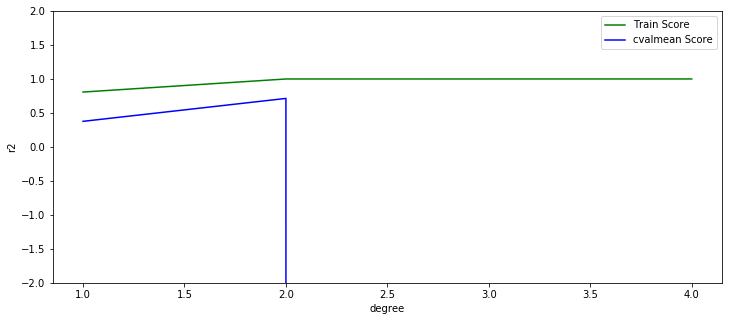

In [56]:
plt.figure(figsize = (12,5))
x_axis = range(1,5)
plt.plot(x_axis, train_score, c = 'g', label = 'Train Score')
plt.plot(x_axis, cvalmean_score, c = 'b', label = 'cvalmean Score')
plt.xlabel('degree')
plt.ylim(-2,2)
plt.ylabel('r2')
plt.legend()
plt.show()

### We can see that our scores have improved considerably and using degree 2 polynomial provides us with the best score, lets see if is able to generalize our test data

### Lets see the results on the Test data set

In [57]:
poly = PolynomialFeatures(2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)
plreg.fit(X_train_poly, y_train)
print(plreg.score(X_train_poly, y_train))
print(plreg.score(X_test_poly, y_test))

0.9995754740758478
0.9775585459002908


### We can clearly see here that based on our analysis the test score has also considerably increased to 0.97

In [58]:
f = open('Audit_risk_regg_result.csv','a')#append the lines into the file
line = 'Poly,d= 2,'  +str(plreg.score(X_train_poly,y_train)) + ',' + str(plreg.score(X_test_poly, y_test)) + '\n'
f.write(line)
f.close()

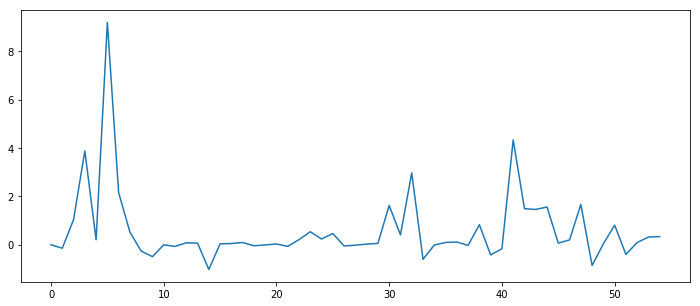

In [59]:
plt.figure(figsize = (12,5))
plt.plot(range(len(plreg.coef_)),plreg.coef_)
plt.show()

### We can estimate from above chart that some of the feature's cofficient (can be product of two or square of one) has very high value . So we can conclude that our research was accurate and the model performance has considerably improved with both train and test scores of 0.99 and 0.97 respectively

In [60]:
#Prediction plot with different features
## Distribution Plots 
Feature= widgets.Dropdown(options= list(X.columns))

def plot_preg(Feature):                            
    i =  pd.DataFrame(X.columns)
    j = i.reset_index()
    key = j[j[0] == Feature]['index']
    %matplotlib inline
    plt.figure(figsize = (16,5))
    X_b = X_train[:,key].reshape(-1,1)
    y_b = y_train[:]
    poly = PolynomialFeatures(2)
    X_b_poly = poly.fit_transform(X_b)
    plreg.fit(X_b_poly, y_train)
    X_new=np.linspace(X_b.min(), X_b.max(),582).reshape(582 , 1)
    y_predict = plreg.predict(X_b_poly)
    plt.plot(X_new, y_predict, c = 'r')
    plt.scatter(X_b, y_b)
    flush_figures()
                            
interactive(plot_preg, Feature=Feature)

interactive(children=(Dropdown(description='Feature', options=('Sector_score', 'PARA_A', 'PARA_B', 'numbers', …

## Knn Regressor

### Using Gridsearch

In [61]:
param_grid = {'n_neighbors': [1,3,5,7,9,11,13,15,17]}
print("Parameter grid:\n{}".format(param_grid))

Parameter grid:
{'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17]}


In [62]:
grid_search = GridSearchCV(KNeighborsRegressor(), param_grid, cv=5, return_train_score=True)
grid_search.fit(X_train, y_train)
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))


Best parameters: {'n_neighbors': 1}
Best cross-validation score: 0.73


In [63]:
knn = KNeighborsRegressor(grid_search.best_params_['n_neighbors'])
knn.fit(X_train, y_train)
test_score = knn.score(X_test, y_test)
train_score = knn.score(X_train, y_train)
print("Train set score with best parameters: {:.2f}".format(train_score))
print("Test set score with best parameters: {:.2f}".format(test_score))

Train set score with best parameters: 1.00
Test set score with best parameters: 0.14


### In the above Grid search we see that our best parameter is at k=1 but it is not performing well on the test data, it has a very low test score of 0.14

### Here we can visually see by changing the parameter and feature name the performance on knn on our data

In [64]:
#Prediction plot with best parameter

## Distribution Plots 
Feature= widgets.Dropdown(options= list(X.columns))
Parameter= widgets.Dropdown(options= [1,3,5,7,9,11])

def plot_knn(Feature,Parameter):                            
    i =  pd.DataFrame(X.columns)
    j = i.reset_index()
    key = j[j[0] == Feature]['index']
    %matplotlib inline
    plt.figure(figsize = (16,5))
    
    X_b = X_train[:50,key].reshape(-1,1)
    y_b = y_train[:50]
    
    X_bt = X_test[:50,key].reshape(-1,1)
    y_bt = y_test[:50]
    
    
    knn_reg = KNeighborsRegressor(Parameter)
    knn_reg.fit(X_b, y_b)
    plt.subplot(1,2,1)
    X_new=np.linspace(X_b.min(), X_b.max(), 50).reshape(50, 1)
    X_new_t=np.linspace(X_bt.min(), X_bt.max(), 50).reshape(50, 1)
    y_predict = knn_reg.predict(X_new)
    y_predict_test = knn_reg.predict(X_new_t)

    plt.subplot(1,2,1)
    plt.plot(X_new, y_predict, c = 'r')
    plt.scatter(X_b, y_b)
    plt.title('Train data prediction',fontsize=16)
    
    plt.subplot(1,2,2)
    plt.plot(X_new_t, y_predict_test, c = 'r')
    plt.scatter(X_b, y_b)
    plt.title('Test data prediction',fontsize=16)
    plt.tight_layout()
    plt.show()
    flush_figures()
                            
interactive(plot_knn, Feature=Feature,Parameter=Parameter)


interactive(children=(Dropdown(description='Feature', options=('Sector_score', 'PARA_A', 'PARA_B', 'numbers', …

We are making one file for recording the results of each algorithm.

In [65]:
f = open('Audit_risk_regg_result.csv','a')#append the lines into the file
line = 'KNeighborsRegressor,k = 1,'  +str(knn.score(X_train,y_train)) + ',' + str(knn.score(X_test, y_test)) + '\n'
f.write(line)
f.close()

## Linear SVR

### Although based on our past analysis linear model performance has not been great, lets see how Linear SVR performs

In [66]:
train_score = []
test_score = []
param_grid = {'C': [0.1,1, 10, 100, 1000], 'epsilon': [0.001,0.01, 1,10, 100], 'kernel': ['linear']} 
grid = GridSearchCV(SVR(),param_grid,refit=True,verbose=3)
grid.fit(X_train,y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
[CV] C=0.1, epsilon=0.001, kernel=linear .............................
[CV]  C=0.1, epsilon=0.001, kernel=linear, score=0.5941982128571481, total=   0.0s
[CV] C=0.1, epsilon=0.001, kernel=linear .............................
[CV]  C=0.1, epsilon=0.001, kernel=linear, score=0.6748979232391903, total=   0.0s
[CV] C=0.1, epsilon=0.001, kernel=linear .............................
[CV]  C=0.1, epsilon=0.001, kernel=linear, score=0.6572920663082895, total=   0.0s
[CV] C=0.1, epsilon=0.01, kernel=linear ..............................
[CV]  C=0.1, epsilon=0.01, kernel=linear, score=0.5942407556815592, total=   0.0s
[CV] C=0.1, epsilon=0.01, kernel=linear ..............................
[CV]  C=0.1, epsilon=0.01, kernel=linear, score=0.6748494165318957, total=   0.0s
[CV] C=0.1, epsilon=0.01, kernel=linear ..............................
[CV]  C=0.1, epsilon=0.01, kernel=linear, score=0.6570924370032549, total=   0.0s
[CV] C=0.1, epsilo

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  C=1, epsilon=0.001, kernel=linear, score=0.6961816516961924, total=   0.0s
[CV] C=1, epsilon=0.001, kernel=linear ...............................
[CV]  C=1, epsilon=0.001, kernel=linear, score=0.6618985425437895, total=   0.0s
[CV] C=1, epsilon=0.01, kernel=linear ................................
[CV]  C=1, epsilon=0.01, kernel=linear, score=0.6745190962076967, total=   0.0s
[CV] C=1, epsilon=0.01, kernel=linear ................................
[CV]  C=1, epsilon=0.01, kernel=linear, score=0.6962840034707398, total=   0.0s
[CV] C=1, epsilon=0.01, kernel=linear ................................
[CV]  C=1, epsilon=0.01, kernel=linear, score=0.6620221632106916, total=   0.0s
[CV] C=1, epsilon=1, kernel=linear ...................................
[CV]  C=1, epsilon=1, kernel=linear, score=0.6912225337567506, total=   0.0s
[CV] C=1, epsilon=1, kernel=linear ...................................
[CV]  C=1, epsilon=1, kernel=linear, score=0.7206034116811375, total=   0.0s
[CV] C=1, epsilon=

[CV]  C=1000, epsilon=10, kernel=linear, score=0.44900672970033284, total=   0.2s
[CV] C=1000, epsilon=100, kernel=linear ..............................
[CV]  C=1000, epsilon=100, kernel=linear, score=-10.590790007515846, total=   0.0s
[CV] C=1000, epsilon=100, kernel=linear ..............................
[CV]  C=1000, epsilon=100, kernel=linear, score=-36.17528990728673, total=   0.0s
[CV] C=1000, epsilon=100, kernel=linear ..............................
[CV]  C=1000, epsilon=100, kernel=linear, score=-59.07526295764526, total=   0.0s


[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:   45.0s finished


GridSearchCV(cv='warn', error_score='raise-deprecating',
       estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [0.1, 1, 10, 100, 1000], 'epsilon': [0.001, 0.01, 1, 10, 100], 'kernel': ['linear']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=3)

### Using gridsearch we get our best parameters at C=1000 and epsilon = 1 

In [67]:
grid.best_params_


{'C': 1000, 'epsilon': 1, 'kernel': 'linear'}

In [68]:
grid.best_estimator_

SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=1,
  gamma='auto_deprecated', kernel='linear', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

In [69]:
svr_rbf_best = SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=1,
  kernel='linear', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
svr_rbf_best.fit(X_train,y_train)
print(svr_rbf_best.score(X_train,y_train))

scores = cross_val_score(svr_rbf_best, X_train,y_train,cv = 5)
print("Cross-validation scores : {}".format(scores))


0.715612488214362
Cross-validation scores : [ 0.60552395  0.87358264  0.70304574 -6.49968713  0.62393842]


### Scores are not good as polynomial reg but better that linear regression lets see the scores on test data 

In [70]:
svr_rbf_best.fit(X_train,y_train)
print(svr_rbf_best.score(X_train,y_train))
print(svr_rbf_best.score(X_test,y_test))

0.715612488214362
0.3980023031574381


### Again here we can see that the model is not able to generalize in an improved manner leading to a low test score of 0.39 

In [71]:
f = open('Audit_risk_regg_result.csv','a')#append the lines into the file
line = 'SVR(linear),C: 1000, kernel: linear,'  +str(svr_rbf_best.score(X_train,y_train)) + ',' + str(svr_rbf_best.score(X_test, y_test)) + '\n'
f.write(line)
f.close()

## SVR('rbf')

In [72]:
param_grid = {'C': [0.1,1, 10, 100,1000], 'gamma': [1,0.1,0.01,0.001], 'kernel': ['rbf']} 
grid = GridSearchCV(SVR(),param_grid,refit=True,verbose=3,cv = 5)

In [73]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV]  C=0.1, gamma=1, kernel=rbf, score=-0.01628276349918023, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV]  C=0.1, gamma=1, kernel=rbf, score=-0.026673505924858842, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV]  C=0.1, gamma=1, kernel=rbf, score=-0.031276784312739725, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV]  C=0.1, gamma=1, kernel=rbf, score=0.06422472181628447, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV]  C=0.1, gamma=1, kernel=rbf, score=0.019048175129012468, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV]  C=0.1, gamma=0.1, kernel=rbf, score=0.011902923980827484, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ...................

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV]  C=0.1, gamma=0.01, kernel=rbf, score=-0.0421959854168481, total=   0.0s
[CV] C=0.1, gamma=0.01, kernel=rbf ...................................
[CV]  C=0.1, gamma=0.01, kernel=rbf, score=-0.03833120137764623, total=   0.0s
[CV] C=0.1, gamma=0.01, kernel=rbf ...................................
[CV]  C=0.1, gamma=0.01, kernel=rbf, score=-0.0061826681200312095, total=   0.0s
[CV] C=0.1, gamma=0.01, kernel=rbf ...................................
[CV]  C=0.1, gamma=0.01, kernel=rbf, score=0.015518546695749922, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV]  C=0.1, gamma=0.001, kernel=rbf, score=-0.06631657759209753, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV]  C=0.1, gamma=0.001, kernel=rbf, score=-0.1169284724454629, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV]  C=0.1, gamma=0.001, kernel=rbf, score=-0.0973322683297735, total=   0.0s
[CV] C=0.1, gamma=0

[CV]  C=100, gamma=0.1, kernel=rbf, score=0.3179498072280186, total=   0.0s
[CV] C=100, gamma=0.1, kernel=rbf ....................................
[CV]  C=100, gamma=0.1, kernel=rbf, score=0.6639155476718054, total=   0.0s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV]  C=100, gamma=0.01, kernel=rbf, score=0.8430629849106892, total=   0.0s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV]  C=100, gamma=0.01, kernel=rbf, score=0.9643928811744455, total=   0.0s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV]  C=100, gamma=0.01, kernel=rbf, score=0.8884002678278476, total=   0.0s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV]  C=100, gamma=0.01, kernel=rbf, score=0.6575188681220283, total=   0.0s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV]  C=100, gamma=0.01, kernel=rbf, score=0.9100514456129243, total=   0.0s
[CV] C=100, gamma=0.001, kernel=rbf .

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.6s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001], 'kernel': ['rbf']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=3)

### Using gridsearch we get our best parameters at C=1000 and gamma = 0.01 

In [74]:
grid.best_params_

{'C': 1000, 'gamma': 0.01, 'kernel': 'rbf'}

In [75]:
grid.best_estimator_

SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.01,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [76]:
svr_rbf_best = SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=.01,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
svr_rbf_best.fit(X_train,y_train)
print(svr_rbf_best.score(X_train,y_train))

scores = cross_val_score(svr_rbf_best, X_train,y_train,cv = 5)
print("Cross-validation scores : {}".format(scores))



0.999829537672033
Cross-validation scores : [0.94822114 0.97896396 0.94038281 0.82657642 0.98215974]


### Scores are really good and nealy equal to polynomial reg lets see the test scores



In [77]:
print(svr_rbf_best.score(X_train,y_train))
print(svr_rbf_best.score(X_test,y_test))

0.999829537672033
0.15271917855412553


### As seen in SVR linear kernel , the results for the rbf kernel are also not good with a very low test score of 0.15, implying highly overfitted model 

In [78]:
f = open('Audit_risk_regg_result.csv','a')#append the lines into the file
line = 'SVR(rbf),C: 1000,gamma = 0.01, kernel: rbf,'  +str(svr_rbf_best.score(X_train,y_train)) + ',' + str(svr_rbf_best.score(X_test, y_test)) + '\n'
f.write(line)
f.close()

## SVR('poly')

In [79]:
param_grid = {'C': [0.1,1, 10, 100, 1000],'degree':[1,2,3,4], 'kernel': ['poly']} 
grid = GridSearchCV(SVR(),param_grid,refit=True,verbose=3,cv = 5)

In [80]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] C=0.1, degree=1, kernel=poly ....................................
[CV]  C=0.1, degree=1, kernel=poly, score=0.24624803439359355, total=   0.0s
[CV] C=0.1, degree=1, kernel=poly ....................................
[CV]  C=0.1, degree=1, kernel=poly, score=0.3900052473252724, total=   0.0s
[CV] C=0.1, degree=1, kernel=poly ....................................
[CV]  C=0.1, degree=1, kernel=poly, score=0.297700237284229, total=   0.0s
[CV] C=0.1, degree=1, kernel=poly ....................................
[CV]  C=0.1, degree=1, kernel=poly, score=0.6924988051698897, total=   0.0s
[CV] C=0.1, degree=1, kernel=poly ....................................
[CV]  C=0.1, degree=1, kernel=poly, score=0.3624494451123099, total=   0.0s
[CV] C=0.1, degree=2, kernel=poly ....................................
[CV]  C=0.1, degree=2, kernel=poly, score=0.39922642697137856, total=   0.0s
[CV] C=0.1, degree=2, kernel=poly .....................

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  C=0.1, degree=3, kernel=poly, score=0.8900702438853315, total=   0.0s
[CV] C=0.1, degree=4, kernel=poly ....................................
[CV]  C=0.1, degree=4, kernel=poly, score=0.6425226358163767, total=   0.0s
[CV] C=0.1, degree=4, kernel=poly ....................................
[CV]  C=0.1, degree=4, kernel=poly, score=-2.2123933385935, total=   0.0s
[CV] C=0.1, degree=4, kernel=poly ....................................
[CV]  C=0.1, degree=4, kernel=poly, score=-0.3856464566472904, total=   0.0s
[CV] C=0.1, degree=4, kernel=poly ....................................
[CV]  C=0.1, degree=4, kernel=poly, score=-15.52470665872714, total=   0.0s
[CV] C=0.1, degree=4, kernel=poly ....................................
[CV]  C=0.1, degree=4, kernel=poly, score=0.7643980363701188, total=   0.0s
[CV] C=1, degree=1, kernel=poly ......................................
[CV]  C=1, degree=1, kernel=poly, score=0.5729749429187799, total=   0.0s
[CV] C=1, degree=1, kernel=poly .............

[CV]  C=100, degree=3, kernel=poly, score=-13.209472689740293, total=   0.2s
[CV] C=100, degree=3, kernel=poly ....................................
[CV]  C=100, degree=3, kernel=poly, score=-47.85654758715058, total=   0.2s
[CV] C=100, degree=3, kernel=poly ....................................
[CV]  C=100, degree=3, kernel=poly, score=-3.658629240358479, total=   0.2s
[CV] C=100, degree=4, kernel=poly ....................................
[CV]  C=100, degree=4, kernel=poly, score=-27.177400544805074, total=   0.1s
[CV] C=100, degree=4, kernel=poly ....................................
[CV]  C=100, degree=4, kernel=poly, score=-903.3572411048995, total=   0.1s
[CV] C=100, degree=4, kernel=poly ....................................
[CV]  C=100, degree=4, kernel=poly, score=-319.21191820487195, total=   0.1s
[CV] C=100, degree=4, kernel=poly ....................................
[CV]  C=100, degree=4, kernel=poly, score=-280.15650237322757, total=   0.1s
[CV] C=100, degree=4, kernel=poly ....

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   36.4s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [0.1, 1, 10, 100, 1000], 'degree': [1, 2, 3, 4], 'kernel': ['poly']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=3)

### Using gridsearch we get our best parameters at C=1 and degree = 1 

In [81]:
grid.best_params_

{'C': 1, 'degree': 1, 'kernel': 'poly'}

In [82]:
grid.best_estimator_

SVR(C=1, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
  gamma='auto_deprecated', kernel='poly', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False)

In [83]:
svr_rbf_best = SVR(C=1, cache_size=200, coef0=0.0, degree=1, epsilon=0.1, gamma='auto_deprecated',
  kernel='poly', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
svr_rbf_best.fit(X_train,y_train)
print(svr_rbf_best.score(X_train,y_train))

scores = cross_val_score(svr_rbf_best, X_train,y_train,cv = 5)
print("Cross-validation scores : {}".format(scores))


##overfit model


0.6813698674052653
Cross-validation scores : [0.57297494 0.8276259  0.67317574 0.72873108 0.5954538 ]


In [84]:
#Scores are not really good  lets see the test scores
print(svr_rbf_best.score(X_train,y_train))
print(svr_rbf_best.score(X_test,y_test))

0.6813698674052653
0.3598429469741705


### The results for the poly kernel are also not good with a very low test score of 0.35 and train score of 0.68

In [85]:
f = open('Audit_risk_regg_result.csv','a')#append the lines into the file
line = 'SVR(poly),C: ,d =2 , kernel: poly'  +str(svr_rbf_best.score(X_train,y_train)) + ',' + str(svr_rbf_best.score(X_test,y_test)) + '\n'
f.write(line)
f.close()

## Decision Tree Regressor


In [86]:
## data sampling without scaling
X_train1, X_test1, y_train1, y_test1 = train_test_split( X[feature_list], y, test_size = 0.25, random_state = 100)                                            

In [87]:
dtree = DecisionTreeRegressor()
dtree.fit(X_train1,y_train1)
print(dtree.score(X_train1,y_train1))


scores = cross_val_score(dtree, X_train1,y_train1,cv = 5)
print("Cross-validation scores : {}".format(scores))
print("Average cross-validation score: {:.2f}".format(scores.mean()))

0.9999999999962226
Cross-validation scores : [0.64822099 0.27998974 0.58843658 0.6573036  0.46725158]
Average cross-validation score: 0.53


In [88]:
# Create DOT data
dot_data = export_graphviz(dtree, out_file=None, filled=True, rounded=True, special_characters=True)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  
# Show graph
Image(graph.create_png())

### Without controlling the depth of the tree the results are as expected with a overfitting model with a near perfect train score,  but our crossvalidation score is not good with an average score of 0.39 , lets change the parameters to make it better

### In order to change the parameters we first try and analyse the the important features by the visual below

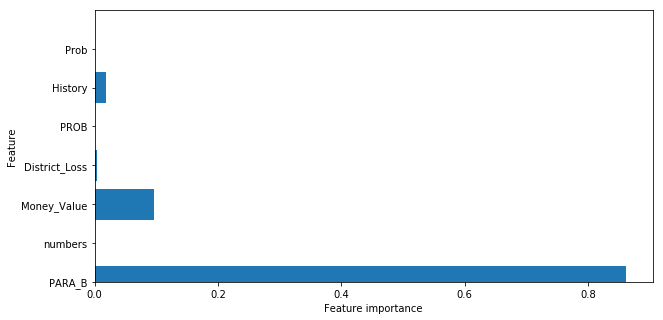

In [89]:
%matplotlib inline
def plot_feature_importances(model):
    plt.figure(figsize = (10,5))
    n_features = X[feature_list].shape[1]
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), X.columns.values)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.tick_params(axis='y', which='major', labelsize=10)
    plt.ylim(2, n_features)
    

plot_feature_importances(dtree)

In [90]:
##Topfeatures
dfx = pd.concat([pd.DataFrame(dtree.feature_importances_),pd.DataFrame(X[feature_list].columns)],axis =1)
dfx.columns = ['imp','x']
# feature_list = list(dfx.sort_values('imp',ascending = False).head(10).x)

In [91]:
dfx.sort_values('imp',ascending = False)

,imp,x
2,0.861705,PARA_B
4,0.095816,Money_Value
7,0.018404,History
0,0.016350,Sector_score
5,0.004001,District_Loss
1,0.002165,PARA_A
3,0.000897,numbers
8,0.000543,Prob
6,0.000120,PROB


### Lets change parameters and see the results

In [92]:
## data sampling
X_train1, X_test1, y_train1, y_test1 = train_test_split( X[feature_list], y, test_size = 0.25, random_state = 100)                                            
X_train1, X_val, y_train1, y_val = train_test_split( X_train1, y_train1, test_size = 0.25, random_state = 100)                           
                           
labels = X_train1.columns
    
    
## Defining a function named "plot_tree" to plot decision tree 

def plot_tree(crit, split, depth , min_split, min_leaf=0.2):
    estimator = DecisionTreeRegressor(random_state = 0  
      , criterion = crit
      , splitter = split
      , max_depth = depth
      , min_samples_split=min_split
      , min_samples_leaf=min_leaf)
    estimator.fit(X_train1, y_train1)   ##Training the model
    
    predictions = estimator.predict(X_val) ## testing the model on test data
    
    print("Controlled Decision Tree : Change the above parameters and observe the difference.","\n","To see the effect of pruning, change the tree depth and notice the change in various metrics")
    print("\n")
    
    ##overfitting check
    print("Scores on training set: {:.3f}".format(estimator.score(X_train1, y_train1)))
    print("Score on validation set: {:.3f}".format(estimator.score(X_val, y_val)))
    graph = Source(tree.export_graphviz(estimator
      , out_file=None
      , feature_names=labels, rounded = True, impurity = True
      , filled = True))
   
    display(SVG(graph.pipe(format='svg')))
    return estimator



##using IPython.core.interactiveshel package for better visualization of tree

inter=interactive(plot_tree        ##using plt_tree function in interactive
   , crit = ["mse", "mae"]
   , split = ["best", "random"]
   , depth=[1,2,3,4,5,6,7,8,9,10,11,12]
   , min_split=(2)
   , min_leaf=5)


display(inter)                              



interactive(children=(Dropdown(description='crit', options=('mse', 'mae'), value='mse'), Dropdown(description=…

### By varing the above sliders and dropdowns we found Tree is not a good option for this data   

In [93]:
dtree = DecisionTreeRegressor()
dtree.fit(X_train1, y_train1)       
print(dtree.score(X_train1,y_train1))
print(dtree.score(X_test1,y_test1))

0.9999999999963414
0.6788978231329081


### here the scores are not bad but model is overfitting, with high train score or 0.99

## Step 4: Evalutaion - Regression Analysis

### Based on all the above models we can gather the following insights:

### 1. Our model performance greatly improved when we considered the base features based on our research
### 2. Linear models are not able to generalize in a better manner, implying that variables have a polynomial relation to audit risk .

### Lets have a look at our results below

In [94]:
import pandas as pd
results_regression = pd.read_csv('scores_regression.csv')
results_regression

,Model Name,Train_Score,Avg_Cross_Val Score,Test_Score
0,Linear Regression,0.8158,0.4100,0.4210
1,SGD Regressor,0.8151,0.4200,0.4240
2,Ridge Regression,0.7000,0.6300,0.2800
3,Lasso Regression,0.7900,0.6000,0.40'
4,Polynomial Regression,0.9900,0.9900,0.9700
5,Knn Regressor,1.0000,0.7300,0.1400
6,SVR('linear'),0.7150,0.7150,0.3980
7,SVR('rbf'),0.9900,0.9900,0.1520
8,SVR('poly'),0.6813,0.6813,0.3590
9,Decision Tree,0.9900,0.3900,0.5860


### From the above parameters we can clearly see that Polynomial regression has the best scores and thus is our best choice to predict audit risk

## Classification Models

## Under classification we are going to use the same base variables that we found by research as our independent variables, here we are trying to predict whether a firm is risky or not.

## Step 2 - Data Understanding, Preparation & Transformation

## For the purpose of classification we are going to assess and trasform our data for further modeling

In [95]:
##Classification Data 
df_ar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 776 entries, 0 to 775
Data columns (total 32 columns):
Sector_score      776 non-null float64
LOCATION_ID       776 non-null object
PARA_A            776 non-null float64
Score_A           776 non-null float64
Risk_A            776 non-null float64
PARA_B            776 non-null float64
Score_B           776 non-null float64
Risk_B            776 non-null float64
TOTAL             776 non-null float64
numbers           776 non-null float64
Score_B.1         776 non-null float64
Risk_C            776 non-null float64
Money_Value       776 non-null float64
Score_MV          776 non-null float64
Risk_D            776 non-null float64
District_Loss     776 non-null int64
PROB              776 non-null float64
RiSk_E            776 non-null float64
History           776 non-null int64
Prob              776 non-null float64
Risk_F            776 non-null float64
Score             776 non-null float64
Inherent_Risk     776 non-null float64
CON

In [96]:
df_trail.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 776 entries, 0 to 775
Data columns (total 18 columns):
Sector_score     776 non-null float64
LOCATION_ID      776 non-null object
PARA_A           776 non-null float64
SCORE_A          776 non-null int64
PARA_B           776 non-null float64
SCORE_B          776 non-null int64
TOTAL            776 non-null float64
numbers          776 non-null float64
Marks            776 non-null int64
Money_Value      775 non-null float64
MONEY_Marks      776 non-null int64
District         776 non-null int64
Loss             776 non-null int64
LOSS_SCORE       776 non-null int64
History          776 non-null int64
History_score    776 non-null int64
Score            776 non-null float64
Risk             776 non-null int64
dtypes: float64(7), int64(10), object(1)
memory usage: 109.2+ KB


In [97]:
df_ar.Risk.value_counts()

0    471
1    305
Name: Risk, dtype: int64

In [98]:
df_trail.Risk.value_counts()

1    486
0    290
Name: Risk, dtype: int64

### On reviewing both data sets i.e. audit risk and trial we can see that we have different number of 1 and 0 labels. In Audit risk data we have more balanced records hence for the purpose of our classification modeling we will use the mergred audit risk data set.

### Based on our earlier analysis we found the following relationships between different variables:

 - PARA_A * Score_A = Risk_A
 - PARA_B * Score_B = Risk_B
 - PARA_A + PARA_B = Total
 - numbers * Score_B.1 = Risk_C
 - Money_Value * Score_MV = Risk_D
 - District_Loss * Prob = Risk_E
 - History * Prob = Risk_F
 - inherent_Risk =  Total of all the Risks
 
 - Score_A... = All of the Scores are weights given to specific parameter for a particular sector, we can clarify that in the Scatter plot above in the data exploration section.
 - Score = Total of all the scores
 - Control_Risk = constant Value given to the sectors 
 - Audit Risk = inherent risk * control risk * detection risk
 
### Based on the research and analysis above we can clearly see that a lot of features are a derivation of some other features that we can call base features, hence it makes sense to use only those features that are not derived by any of the other feature i.e our base features which are:

### Sector_score,Para_A,Para_B,numbers,Money_Value,District_Loss,Prob,History & Prob

In [99]:
feature_list = ['Sector_score','PARA_A','PARA_B','numbers','Money_Value','District_Loss','PROB','History','Prob']

In [100]:
X = df_ar[feature_list]
y = df_ar.Risk

In [101]:
X.head()

,Sector_score,PARA_A,PARA_B,numbers,Money_Value,District_Loss,PROB,History,Prob
0,3.89,4.18,2.50,5.0,3.38,2,0.2,0,0.2
1,3.89,0.00,4.83,5.0,0.94,2,0.2,0,0.2
2,3.89,0.51,0.23,5.0,0.00,2,0.2,0,0.2
3,3.89,0.00,10.80,6.0,11.75,2,0.2,0,0.2
4,3.89,0.00,0.08,5.0,0.00,2,0.2,0,0.2


In [102]:
y.head()

0    1
1    0
2    0
3    1
4    0
Name: Risk, dtype: int64

### Let us also try and analyse the trends and distributions of different features with risk category

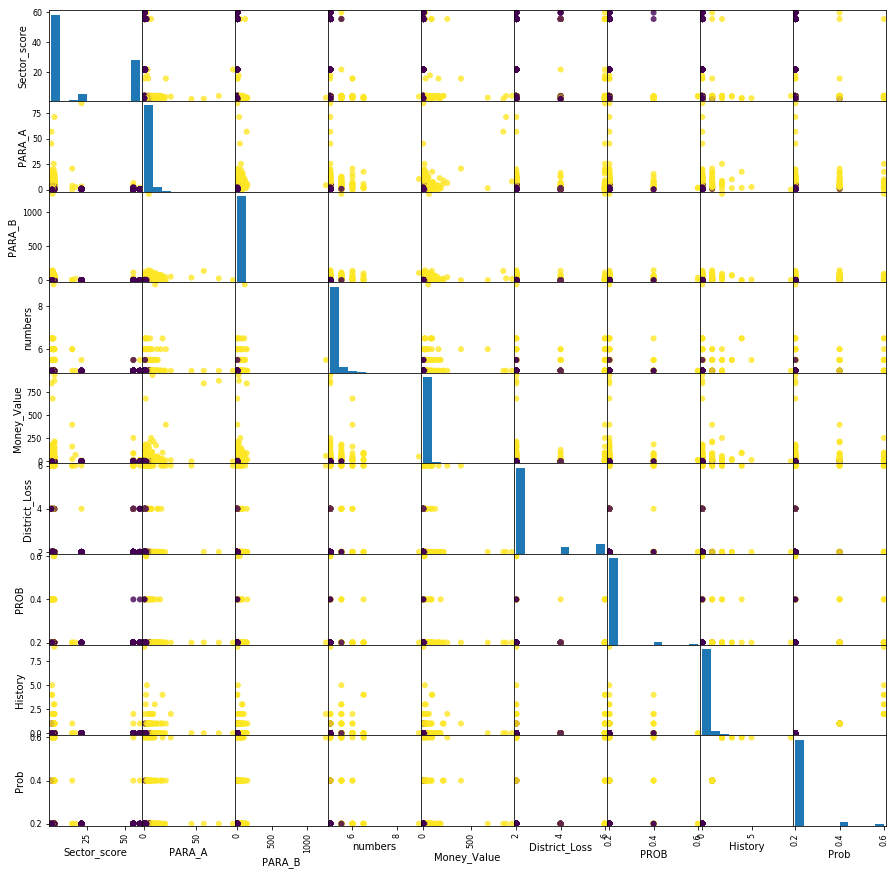

In [103]:
%matplotlib inline
scatter_matrix(X, figsize = (15,15), c = y, alpha = 0.8, marker = 'O')
plt.show()

In [104]:
X = df_ar[feature_list]
y = df_ar.Risk
Select_X= widgets.Dropdown(options= list(X.columns))
Select_Y= widgets.Dropdown(options= list(X.columns))

def plotit_regplt(Select_X,Select_Y):
    X = df_ar[feature_list]
    y = df_ar.Risk
    plt.figure(figsize = (16,5))
    sns.scatterplot(x=Select_X, y=Select_Y,data=X,hue = y)
    flush_figures()
interactive(plotit_regplt, Select_X=Select_X,Select_Y=Select_Y)

interactive(children=(Dropdown(description='Select_X', options=('Sector_score', 'PARA_A', 'PARA_B', 'numbers',…

In [105]:
# Make a dropdown to select the variable
X = df_ar[feature_list]
y = df_ar.Risk
Variable = widgets.Dropdown(options= list(X.columns))

def plotit(Variable):
    X = df_ar[feature_list]
    y = df_ar.Risk
    key = Variable
    x = pd.crosstab(df_ar[key],df_ar.Risk)
    x.plot(kind="bar",figsize=(15,6),stacked=True)
    plt.title(key + ' vs Risk')
    plt.show() 
    
interactive(plotit, Variable=Variable)

interactive(children=(Dropdown(description='Variable', options=('Sector_score', 'PARA_A', 'PARA_B', 'numbers',…

 ### From the above plots we can gain the following insights:
 
 #### -Prob greater than 0.2 has a very high chance of class 1 label
 #### -History greater than 0 is has majorly class 1 labels
 #### -numbers greater than 5 have a majority of class 1 labels
 #### -sector scores are equally distributed 

In [106]:
## Distribution Plots
Feature= widgets.Dropdown(options= list(X.columns))
Plot_Type= widgets.RadioButtons(options= ['Distribution Plot','Box Plot'])

def plotit(Feature,Plot_Type):                            
    
    %matplotlib inline
    plt.figure(figsize = (16,5))
    if Plot_Type == 'Distribution Plot':
        sns.distplot(X[Feature])    
        plt.ylabel('freq')
        plt.title(Feature +' : Distribution')

    elif Plot_Type == 'Box Plot':
        sns.boxplot(x="Risk", y=Feature,
                data=df_ar, palette="Set3")

        plt.title(Feature +' : Box Plot')
    flush_figures()
                            
interactive(plotit, Feature=Feature,Plot_Type=Plot_Type)

interactive(children=(Dropdown(description='Feature', options=('Sector_score', 'PARA_A', 'PARA_B', 'numbers', …

In [107]:
#Spliting the data into train and test sets
X_train_org, X_test_org, y_train, y_test = train_test_split(X, y, random_state=0)

scaler = StandardScaler()
scaler.fit(X_train_org)
X_train = scaler.transform(X_train_org)
X_test = scaler.transform(X_test_org)

print("Size of training set: {}      size of test set:"
      " {}\n".format(X_train.shape[0], X_test.shape[0]))




Size of training set: 582      size of test set: 194



# Step 3 - Modeling - Classification

### - In modeling our data our approach will be three-fold:

### 1. We will use the training data to train our model along with grid search and cross validation to tune various hyper parameters in the model

### 2. Then we will use those parameters and the best model to predict our test data score

### 3. We will see which model gives us with best recall score i.e the least type 2 error in our classification

### We will implement the following models for classification:

### 1. KNN classifcation
### 2. Logistic Regression
### 3. Linear Supprt Vector Machine 
### 4. Kerenilzed Support Vector Machine
### 5. Decision Tree


## KNN classifcation

In [108]:
param_grid = {'n_neighbors': [1,3,5,7,9,11,13,15,17]}
print("Parameter grid:\n{}".format(param_grid))

Parameter grid:
{'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17]}


In [109]:
grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, return_train_score=True)
grid_search.fit(X_train, y_train)
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))


Best parameters: {'n_neighbors': 1}
Best cross-validation score: 0.98


### Here we can see that on performing the grid search that our best parameter is at k = 1 and that the model has a good train score, now let us review its performance on the test scores with best parameter

In [110]:
knn = KNeighborsClassifier(grid_search.best_params_['n_neighbors'])
knn.fit(X_train, y_train)
test_score = knn.score(X_test, y_test)
train_score = knn.score(X_train, y_train)
print("Train set score with best parameters: {:.2f}".format(train_score))
print("Test set score with best parameters: {:.2f}".format(test_score))

Train set score with best parameters: 1.00
Test set score with best parameters: 0.96


In [111]:

Select_X= widgets.Dropdown(options= list(X.columns))
Select_Y= widgets.Dropdown(options= list(X.columns))
Select_K= widgets.Dropdown(options= [1,3,5,7,9,11])

def plotit_knnplt(Select_X,Select_Y,Select_K):

    i =  pd.DataFrame(X.columns)
    j = i.reset_index()
    key1 = j[j[0] == Select_X].index.values.astype(int)[0]

    key2 = j[j[0] == Select_Y].index.values.astype(int)[0]
    
    X_b = X_train[:,[key1,key2]]
    y_b = y_train
    knn = KNeighborsClassifier(Select_K)
    knn.fit(X_b, y_b)
    
    plt.figure(figsize = (16,5))
    mglearn.plots.plot_2d_separator(knn, X_b, fill=True, eps=0.5, alpha=.4)
    mglearn.discrete_scatter(X_b[:, 0], X_b[:, 1], y_b)
    plt.xlabel(Select_X)
    plt.ylabel(Select_Y)
    plt.show()
    
interactive(plotit_knnplt, Select_X=Select_X,Select_Y=Select_Y,Select_K = Select_K)

interactive(children=(Dropdown(description='Select_X', options=('Sector_score', 'PARA_A', 'PARA_B', 'numbers',…

### Our goal with this project is that we want a decision boundry that can distinguish the classes so that we do not have any false negative meaning we do not want any Risk 1 predicted as Risk 0, so basically we want our Recall = 1. lets see our other reports and confusion matrix

In [112]:
Select_K= widgets.Dropdown(options= [1,3,5,7,9,11])

def knn_report(Select_K):
    knn = KNeighborsClassifier(Select_K)
    knn.fit(X_train, y_train)
    
    predictions = knn.predict(X_test)
    print("Controlled Knn : Change the above parameters and observe the difference.","\n","To see the effect of parameter, change the k and notice the change in various metrics")
    print("\n")
    
    ##overfitting check

    print("Acuracy on training set: {:.3f}".format(knn.score(X_train, y_train)*100))
    print("Acuracy on test set: {:.3f}".format(knn.score(X_test, y_test)*100))
    
    ##confusion matrix
    print("\n Confusion Matrix: \n")
    print(confusion_matrix(y_test, predictions))
    print("\n Classification Report: \n")
    print(classification_report(y_test, predictions))
    
interactive(knn_report, Select_K = Select_K)
    

interactive(children=(Dropdown(description='Select_K', options=(1, 3, 5, 7, 9, 11), value=1), Output()), _dom_…

### By Changing the above dropdown we find that the minimum we have 5 instances of Type 2 error with k = 1, however at k =1 the model is highly overfitted, our preference over here is at k=3 , which has a better test score of 96.39 and the same instances of type 2 error

## Logistic Regression

In [113]:


param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000,1500,2000,2500,3000],'penalty' : ['l1','l2']}
print("Parameter grid:\n{}".format(param_grid))


Parameter grid:
{'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000, 1500, 2000, 2500, 3000], 'penalty': ['l1', 'l2']}


In [114]:
grid_search = GridSearchCV(LogisticRegression(), param_grid, cv=5, return_train_score=True)
grid_search.fit(X_train, y_train)
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))

Best parameters: {'C': 2000, 'penalty': 'l2'}
Best cross-validation score: 0.99


### Based on our grid search results our best parameter is C=2000 with a l2 penalty, we can clearly see that in our visualization below

In [115]:
results = pd.DataFrame(grid_search.cv_results_)
df = results[['mean_test_score','mean_train_score','param_C','param_penalty']]
dfl1 = df[df.param_penalty == 'l1']
dfl2 = df[df.param_penalty == 'l2']


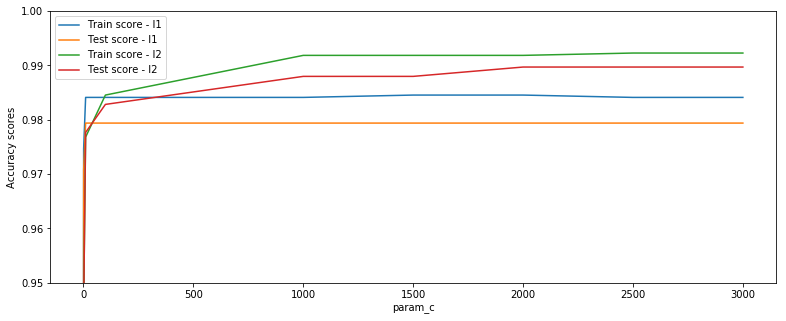

In [116]:
%matplotlib inline
plt.figure(figsize=(13,5))
plt.plot(dfl1.param_C,dfl1.mean_train_score,label = 'Train score - l1' )
plt.plot(dfl1.param_C,dfl1.mean_test_score,label = 'Test score - l1')
plt.plot(dfl2.param_C,dfl2.mean_train_score,label = 'Train score - l2' )
plt.plot(dfl2.param_C,dfl2.mean_test_score,label = 'Test score - l2')
plt.legend()
plt.ylim(.95,1)
plt.xlabel("param_c")
plt.ylabel("Accuracy scores")
plt.show()

### Now that we have the best parameters we can assess the model performance on the test data 

In [117]:
lgreg= LogisticRegression(penalty = 'l2', C = 2000)
lgreg.fit(X_train,y_train)
print("Train Score: {}".format(lgreg.score(X_train,y_train)))
print("Test score: {:.2f}".format(lgreg.score(X_test,y_test)))

Train Score: 0.993127147766323
Test score: 0.99


In [118]:
#Lets see the decision boundaries
Select_X= widgets.Dropdown(options= list(X.drop(['PROB'],axis = 1).columns))
Select_Y= widgets.Dropdown(options= list(X.drop(['PROB'],axis = 1).columns))
Select_C= widgets.Dropdown(options= [ 1, 10, 100, 1000,1500,2000,2500,3000])
Panelty_Type= widgets.RadioButtons(options= ['l1','l2'])



def plotit_lregplt(Select_X,Select_Y,Select_C,Panelty_Type):
    
    c= Select_C
    i =  pd.DataFrame(X.columns)
    j = i.reset_index()
    
    key1 = j[j[0] == Select_X].index.values.astype(int)[0]

    key2 = j[j[0] == Select_Y].index.values.astype(int)[0]
    
    X_b = X_train[10:50, [key1,key1]]
    y_b = y_train[10:50]


    plreg = LogisticRegression(penalty = Panelty_Type, C = c)
    plreg.fit(X_b, y_b)


    %matplotlib inline
    plt.figure(figsize = (12,6))
    mglearn.plots.plot_2d_separator(plreg, X_b, fill=True, eps=0.5, alpha=.4)
    mglearn.discrete_scatter(X_b[:, 0], X_b[:, 1], y_b)
    plt.xlabel(Select_X)
    plt.ylabel(Select_Y)
    plt.legend()
    plt.show()

In [119]:
interactive(plotit_lregplt, Select_X=Select_X,Select_Y=Select_Y,Select_C = Select_C,Panelty_Type=Panelty_Type)

interactive(children=(Dropdown(description='Select_X', options=('Sector_score', 'PARA_A', 'PARA_B', 'numbers',…

### Our objective over here is that we want a decision boundary that can distinguish the classes so that we do not have any false negative meaning we do not want any Risk 1 predicted as Risk 0 , let us analyse the reports and confusion matrix below and see if we are able to reduce our false negatives with the best parameters above 

In [120]:
Select_C= widgets.Dropdown(options= [ 1, 10, 100, 1000,1500,2000,2500,3000])
Panelty_Type= widgets.RadioButtons(options= ['l1','l2'])


def Logreg_report(Select_C,Panelty_Type):
    lgreg = LogisticRegression(penalty = Panelty_Type, C = Select_C)
    lgreg.fit(X_train, y_train)


    predictions = lgreg.predict(X_test)
    print("Controlled Knn : Change the above parameters and observe the difference.","\n","To see the effect of parameter, change the k and notice the change in various metrics")
    print("\n")
    
    ##overfitting check

    print("Acuracy on training set: {:.3f}".format(lgreg.score(X_train, y_train)*100))
    print("Acuracy on test set: {:.3f}".format(lgreg.score(X_test, y_test)*100))
    
    ##confusion matrix
    print("\n Confusion Matrix: \n")
    print(confusion_matrix(y_test, predictions))
    print("\n Classification Report: \n")
    print(classification_report(y_test, predictions))
    
interactive(Logreg_report, Select_C = Select_C,Panelty_Type=Panelty_Type)


interactive(children=(Dropdown(description='Select_C', options=(1, 10, 100, 1000, 1500, 2000, 2500, 3000), val…

### Although with grid search we came with the best parameters of C=2000 and penalty l2, in terms of recall and precision scores we see that at C=100 and penalty l2 we have perfect recall and precision scores, below we have also plot the ROC curve to further analyse our conclusion 

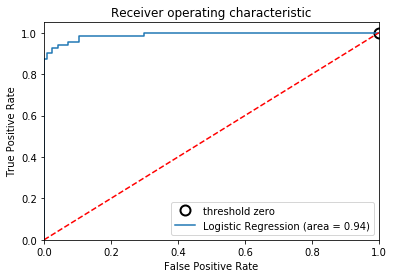

In [121]:
lgreg = LogisticRegression()
lgreg.fit(X_train, y_train)


logit_roc_auc = roc_auc_score(y_test, lgreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lgreg.predict_proba(X_test)[:,1])
plt.figure()

close_zero = np.argmin(np.abs(thresholds))
plt.plot(fpr[close_zero], tpr[close_zero], 'o', markersize=10,
         label="threshold zero", fillstyle="none", c='k', mew=2)
      
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)

plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()



In [122]:
lgreg = LogisticRegression(penalty='l2',C = 100)
lgreg.fit(X_train, y_train)
lgreg.coef_

array([[-0.06197796,  7.81551611, 22.03389154, -0.19981047, 34.51416638,
         3.1467865 ,  0.727979  ,  0.48809789,  0.57274811]])

In [123]:
X.columns

Index(['Sector_score', 'PARA_A', 'PARA_B', 'numbers', 'Money_Value',
       'District_Loss', 'PROB', 'History', 'Prob'],
      dtype='object')

### From the above analysis we can see that by logistic regression we can reach the recall =1 condition at C=100 and penalty of l2, this is by far the best model for our classification problem

## SVM (linear)

In [124]:
param_grid = {'C': [0.1,1, 10, 100, 1000], 'kernel': ['linear']} 
grid = GridSearchCV(SVC(),param_grid,cv = 5,refit=True,verbose=3)
grid.fit(X_train,y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] C=0.1, kernel=linear ............................................
[CV] ... C=0.1, kernel=linear, score=0.9572649572649573, total=   0.0s
[CV] C=0.1, kernel=linear ............................................
[CV] ... C=0.1, kernel=linear, score=0.9230769230769231, total=   0.0s
[CV] C=0.1, kernel=linear ............................................
[CV] ... C=0.1, kernel=linear, score=0.9137931034482759, total=   0.0s
[CV] C=0.1, kernel=linear ............................................
[CV] ... C=0.1, kernel=linear, score=0.9310344827586207, total=   0.0s
[CV] C=0.1, kernel=linear ............................................
[CV] ... C=0.1, kernel=linear, score=0.9224137931034483, total=   0.0s
[CV] C=1, kernel=linear ..............................................
[CV] ..... C=1, kernel=linear, score=0.9829059829059829, total=   0.0s
[CV] C=1, kernel=linear ..............................................
[CV] ..... C=1, k

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.2s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [0.1, 1, 10, 100, 1000], 'kernel': ['linear']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=3)

In [125]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)
print(grid.best_index_)


{'C': 1000, 'kernel': 'linear'}
SVC(C=1000, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)
0.9879725085910653
4


### Based on the above gridsearch our best parameter is at C =1000

In [126]:
svc_linear_best = SVC(C=1000,kernel='linear')
svc_linear_best.fit(X_train,y_train)
print(svc_linear_best.score(X_train,y_train))

scores = cross_val_score(svc_linear_best, X_train,y_train,cv = 5)
print("Cross-validation scores : {}".format(scores))

0.9948453608247423
Cross-validation scores : [1.         1.         1.         0.98275862 0.95689655]


In [127]:
results = pd.DataFrame(grid_search.cv_results_)
df = results[['mean_test_score','mean_train_score','param_C']]
df.head()


,mean_test_score,mean_train_score,param_C
0,0.596220,0.596219,0.001
1,0.883162,0.881441,0.001
2,0.786942,0.786941,0.01
3,0.874570,0.875859,0.01
4,0.908935,0.914515,0.1


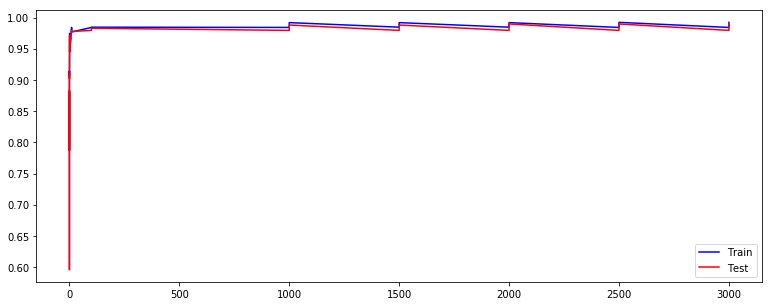

In [128]:
plt.figure(figsize=(13,5))
plt.plot(df.param_C,df.mean_train_score,label = 'Train',c = 'b')
plt.plot(df.param_C,df.mean_test_score,label = 'Test',c = 'r')
plt.legend()
plt.show()

In [129]:
svc= SVC(C = 1000,kernel='linear')
svc.fit(X_train, y_train)
test_score = svc.score(X_test, y_test)
print("Traiin set score with best parameters: {:.2f}".format(svc.score(X_train, y_train)))
print("Test set score with best parameters: {:.2f}".format(test_score))

Traiin set score with best parameters: 0.99
Test set score with best parameters: 0.99


### With our best parameter the scores are quiet good , but let us now analyse the confusion matrix and classification report to see the model performance on other parameters

###  Our ideal situation is to get a recall score of 1

In [130]:
#Lets see the decision boundaries
Select_X= widgets.Dropdown(options= list(X.columns))
Select_Y= widgets.Dropdown(options= list(X.columns))
Select_C= widgets.Dropdown(options= [1, 10, 100, 1000])



def plotit_svm_linear(Select_X,Select_Y,Select_C):
    c= Select_C
    i =  pd.DataFrame(X.columns)
    j = i.reset_index()
    key1 = j[j[0] == Select_X].index.values.astype(int)[0]

    key2 = j[j[0] == Select_Y].index.values.astype(int)[0]
    
    X_b = X_train[10:50, [key1,key1]]
    y_b = y_train[10:50]


    svc = SVC( C = 10,kernel= 'linear')
    svc.fit(X_b, y_b)

    
    
    %matplotlib inline
    plt.figure(figsize = (12,5))
    mglearn.discrete_scatter(X_train[:, key1], X_train[:, key2], y_train)
    line = np.linspace(-15, 15)
    for coef, intercept, color in zip(svc.coef_, svc.intercept_,
                                  mglearn.cm3.colors):
        plt.plot(line, -(line * coef[0] + intercept) / coef[1], c=color)
    plt.ylim(-5, 5)
    plt.xlim(0, 8)
    plt.xlabel("Feature 0")
    plt.ylabel("Feature 1")
    plt.legend(['Class 0', 'Class 1', 'Class 2', 'Line class 0', 'Line class 1',
            'Line class 2'], loc=(1.01, 0.3))
        
interactive(plotit_svm_linear, Select_X=Select_X,Select_Y=Select_Y,Select_C = Select_C)



interactive(children=(Dropdown(description='Select_X', options=('Sector_score', 'PARA_A', 'PARA_B', 'numbers',…

In [131]:
Select_C= widgets.Dropdown(options= [1, 10, 100, 1000])

def SVCL_report(Select_C):
    scv = SVC(kernel= 'linear', C = Select_C)
    scv.fit(X_train, y_train)


    predictions = scv.predict(X_test)
    print("Controlled Linear SVC : Change the above parameters and observe the difference.","\n","To see the effect of parameter, change the C and notice the change in various metrics")
    print("\n")
    
    ##overfitting check

    print("Acuracy on training set: {:.3f}".format(scv.score(X_train, y_train)*100))
    print("Acuracy on test set: {:.3f}".format(scv.score(X_test, y_test)*100))
    
    ##confusion matrix
    print("\n Confusion Matrix: \n")
    print(confusion_matrix(y_test, predictions))
    print("\n Classification Report: \n")
    print(classification_report(y_test, predictions))
    
interactive(SVCL_report, Select_C = Select_C)



interactive(children=(Dropdown(description='Select_C', options=(1, 10, 100, 1000), value=1), Output()), _dom_c…

### from the above we can clearly see that at C = 1000 we have acheived our goal of zero False Negatives

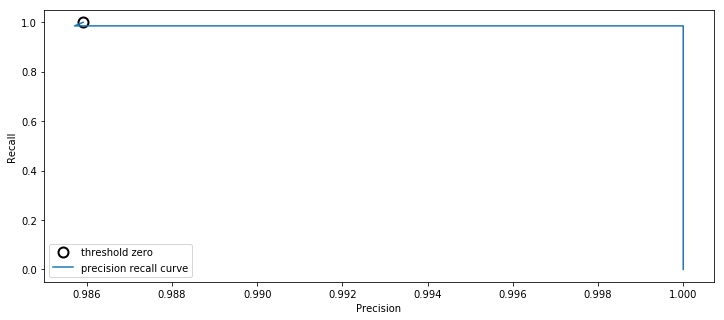

In [132]:
# Recall precision Curve
%matplotlib inline
from sklearn.metrics import precision_recall_curve



svc = SVC(kernel='linear',C=1000).fit(X_train, y_train)

precision, recall, thresholds = precision_recall_curve(y_test, svc.decision_function(X_test))

# find threshold closest to zero
close_zero = np.argmin(np.abs(thresholds))
plt.figure(figsize = (12,5))
plt.plot(precision[close_zero], recall[close_zero], 'o', markersize=10,
         label="threshold zero", fillstyle="none", c='k', mew=2)

plt.plot(precision, recall, label="precision recall curve")
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(loc="best")
plt.show()

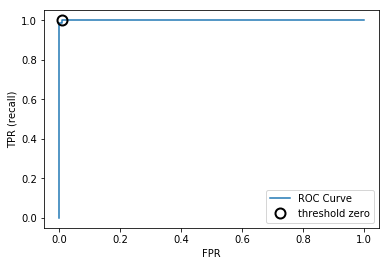

In [133]:
#ROC CURVE
%matplotlib inline 

from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, svc.decision_function(X_test))

plt.plot(fpr, tpr, label="ROC Curve")
plt.xlabel("FPR")
plt.ylabel("TPR (recall)")
# find threshold closest to zero
close_zero = np.argmin(np.abs(thresholds))
plt.plot(fpr[close_zero], tpr[close_zero], 'o', markersize=10,
         label="threshold zero", fillstyle="none", c='k', mew=2)
plt.legend(loc=4)

### we have a perfect ROC curve

## SVM(rbf)

In [134]:

param_grid = {'C': [0.1,1, 10, 100,1000], 'gamma': [1,0.1,0.01,0.001], 'kernel': ['rbf']} 
grid = GridSearchCV(SVC(),param_grid,refit=True,verbose=3,cv = 5)

In [135]:
grid.fit(X_train,y_train)
print(grid.best_params_)
print(grid.best_estimator_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV]  C=0.1, gamma=1, kernel=rbf, score=0.9230769230769231, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV]  C=0.1, gamma=1, kernel=rbf, score=0.8717948717948718, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV]  C=0.1, gamma=1, kernel=rbf, score=0.9137931034482759, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV]  C=0.1, gamma=1, kernel=rbf, score=0.9137931034482759, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV]  C=0.1, gamma=1, kernel=rbf, score=0.9051724137931034, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV]  C=0.1, gamma=0.1, kernel=rbf, score=0.8974358974358975, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ................................

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  C=0.1, gamma=0.001, kernel=rbf, score=0.5948275862068966, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV]  C=0.1, gamma=0.001, kernel=rbf, score=0.5948275862068966, total=   0.0s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV]  C=0.1, gamma=0.001, kernel=rbf, score=0.5948275862068966, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV]  C=1, gamma=1, kernel=rbf, score=0.9743589743589743, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV]  C=1, gamma=1, kernel=rbf, score=0.9487179487179487, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV]  C=1, gamma=1, kernel=rbf, score=0.9396551724137931, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV]  C=1, gamma=1, kernel=rbf, score=0.9568965517241379, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ......................

[CV]  C=1000, gamma=0.01, kernel=rbf, score=0.9655172413793104, total=   0.0s
[CV] C=1000, gamma=0.01, kernel=rbf ..................................
[CV]  C=1000, gamma=0.01, kernel=rbf, score=0.9568965517241379, total=   0.0s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV]  C=1000, gamma=0.001, kernel=rbf, score=0.9914529914529915, total=   0.0s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV]  C=1000, gamma=0.001, kernel=rbf, score=0.9572649572649573, total=   0.0s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV]  C=1000, gamma=0.001, kernel=rbf, score=0.9655172413793104, total=   0.0s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV]  C=1000, gamma=0.001, kernel=rbf, score=0.9741379310344828, total=   0.0s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV]  C=1000, gamma=0.001, kernel=rbf, score=0.9482758620689655, total=   0.0s
{'C': 1000, 'gamma': 0.

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished


### On performing a grid search we get the best parameters at C=1000, gamma = 0.01 and kernel is 'rbf'

In [136]:
svc_rbf_best = SVC(C=1000, cache_size=200, coef0=0.0, degree=3, gamma=.01,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
svc_rbf_best.fit(X_train,y_train)
print(svc_rbf_best.score(X_train,y_train))

scores = cross_val_score(svc_rbf_best, X_train,y_train,cv = 5)
print("Cross-validation scores : {}".format(scores))

0.9828178694158075
Cross-validation scores : [1.         0.98290598 1.         0.96551724 0.95689655]


In [137]:
#Scores are really good and nealy equal to polynomial reg lets see the test scores
print(svc_rbf_best.score(X_train,y_train))
print(svc_rbf_best.score(X_test,y_test))

0.9828178694158075
0.9948453608247423


### Model SVM With rbf kernel has a good score, lets use kernel = 'poly'

## SVM poly

In [138]:
param_grid = {'C': [0.1,1, 10, 100, 1000],'degree':[1,2,3,4], 'kernel': ['poly']} 
grid = GridSearchCV(SVC(),param_grid,refit=True,verbose=3,cv = 5)

In [139]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] C=0.1, degree=1, kernel=poly ....................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  C=0.1, degree=1, kernel=poly, score=0.8888888888888888, total=   0.0s
[CV] C=0.1, degree=1, kernel=poly ....................................
[CV]  C=0.1, degree=1, kernel=poly, score=0.8717948717948718, total=   0.0s
[CV] C=0.1, degree=1, kernel=poly ....................................
[CV]  C=0.1, degree=1, kernel=poly, score=0.8706896551724138, total=   0.0s
[CV] C=0.1, degree=1, kernel=poly ....................................
[CV]  C=0.1, degree=1, kernel=poly, score=0.8879310344827587, total=   0.0s
[CV] C=0.1, degree=1, kernel=poly ....................................
[CV]  C=0.1, degree=1, kernel=poly, score=0.8793103448275862, total=   0.0s
[CV] C=0.1, degree=2, kernel=poly ....................................
[CV]  C=0.1, degree=2, kernel=poly, score=0.8290598290598291, total=   0.0s
[CV] C=0.1, degree=2, kernel=poly ....................................
[CV]  C=0.1, degree=2, kernel=poly, score=0.8290598290598291, total=   0.0s
[CV] C=0.1, degree=2, kernel=poly ........

[CV]  C=100, degree=2, kernel=poly, score=0.9572649572649573, total=   0.0s
[CV] C=100, degree=2, kernel=poly ....................................
[CV]  C=100, degree=2, kernel=poly, score=0.9316239316239316, total=   0.0s
[CV] C=100, degree=2, kernel=poly ....................................
[CV]  C=100, degree=2, kernel=poly, score=0.9310344827586207, total=   0.0s
[CV] C=100, degree=2, kernel=poly ....................................
[CV]  C=100, degree=2, kernel=poly, score=0.9482758620689655, total=   0.0s
[CV] C=100, degree=2, kernel=poly ....................................
[CV]  C=100, degree=2, kernel=poly, score=0.8879310344827587, total=   0.0s
[CV] C=100, degree=3, kernel=poly ....................................
[CV]  C=100, degree=3, kernel=poly, score=0.9743589743589743, total=   0.0s
[CV] C=100, degree=3, kernel=poly ....................................
[CV]  C=100, degree=3, kernel=poly, score=0.9316239316239316, total=   0.0s
[CV] C=100, degree=3, kernel=poly ........

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [0.1, 1, 10, 100, 1000], 'degree': [1, 2, 3, 4], 'kernel': ['poly']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=3)

In [140]:
print(grid.best_estimator_)
print(grid.best_params_)

SVC(C=1000, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=1, gamma='auto_deprecated',
  kernel='poly', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)
{'C': 1000, 'degree': 1, 'kernel': 'poly'}


### On performing gridsearch we get the best parameters at C': 1000, 'degree': 1, 'kernel': 'poly'

In [141]:
svc_poly_best = SVC(C=1000, cache_size=200, coef0=0.0, degree=1, gamma='auto_deprecated',
  kernel='poly', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
svc_poly_best.fit(X_train,y_train)
print(svc_poly_best.score(X_train,y_train))

scores = cross_val_score(svc_poly_best, X_train,y_train,cv = 5)
print("Cross-validation scores : {}".format(scores))


0.9862542955326461
Cross-validation scores : [1.         0.97435897 1.         0.98275862 0.96551724]


In [142]:
#Scores are not really good  lets see the test scores
print(svc_poly_best.score(X_train,y_train))
print(svc_poly_best.score(X_test,y_test))

0.9862542955326461
0.9896907216494846


### from the above scores we can see that the model is doing good but the best degree is 1 which is basically a linear model.

In [143]:
results = pd.DataFrame(grid.cv_results_)
df = results[['mean_test_score','mean_train_score','param_C','param_degree']]
df.head()

,mean_test_score,mean_train_score,param_C,param_degree
0,0.879725,0.876717,0.1,1
1,0.810997,0.811424,0.1,2
2,0.804124,0.804980,0.1,3
3,0.793814,0.802403,0.1,4
4,0.932990,0.934706,1,1


###  REPORT SVM_KERNEL

In [144]:
C= widgets.Dropdown(options= [1, 10, 100, 1000])
KERNEL = widgets.Dropdown(options= ['rbf','poly'])
gamma = widgets.Dropdown(options= [1,0.1,0.01,0.001])
degree = widgets.Dropdown(options= [1,2,3])

def SVM_report(C,KERNEL,gamma,degree):
    scv = SVC(kernel=KERNEL , C = C,gamma = gamma,degree=degree)
    scv.fit(X_train, y_train)


    predictions = scv.predict(X_test)
    print("Controlled SVM : Change the above parameters and observe the difference.","\n","To see the effect of parameter in various metrics")
    print("\n")
    
    ##overfitting check

    print("Acuracy on training set: {:.3f}".format(scv.score(X_train, y_train)*100))
    print("Acuracy on test set: {:.3f}".format(scv.score(X_test, y_test)*100))
    
    ##confusion matrix
    print("\n Confusion Matrix: \n")
    print(confusion_matrix(y_test, predictions))
    print("\n Classification Report: \n")
    print(classification_report(y_test, predictions))
    
interactive(SVM_report,KERNEL=KERNEL ,C = C,gamma = gamma,degree=degree)




interactive(children=(Dropdown(description='C', options=(1, 10, 100, 1000), value=1), Dropdown(description='KE…

### For kernel = poly at c=1000, degree=1 and gamma=1 we have a recall score of 1

### For kernel = rbf at c=1000, degree=1 and gamma=1 we have a recall score of 0.99 i.e we still have one false negative

### let see the RP and ROC curve

In [145]:
# Recall precision Curve
%matplotlib inline
KERNEL = widgets.Dropdown(options= ['rbf','poly'])

def kernel_RP(KERNEL):
    svc = SVC(kernel=KERNEL).fit(X_train, y_train)
    precision, recall, thresholds = precision_recall_curve(y_test, svc.decision_function(X_test))

    # find threshold closest to zero
    close_zero = np.argmin(np.abs(thresholds))
    plt.figure(figsize = (12,5))
    plt.plot(precision[close_zero], recall[close_zero], 'o', markersize=10,
             label="threshold zero", fillstyle="none", c='k', mew=2)

    plt.plot(precision, recall, label="precision recall curve")
    plt.xlabel("Precision")
    plt.ylabel("Recall")
    plt.legend(loc="best")
    plt.show()
    
interactive(kernel_RP,KERNEL=KERNEL)

interactive(children=(Dropdown(description='KERNEL', options=('rbf', 'poly'), value='rbf'), Output()), _dom_cl…

### We can clearly see the difference in both of the kernels, in rbf the cost of getting recall higher is less that poly kernel

In [146]:
#ROC curve
KERNEL = widgets.Dropdown(options= ['rbf','poly'])


%matplotlib inline 
def kernel_Roc(KERNEL):
    svc = SVC(kernel=KERNEL).fit(X_train, y_train)
    fpr, tpr, thresholds = roc_curve(y_test, svc.decision_function(X_test))
    plt.figure(figsize = (12,5))
    plt.plot(fpr, tpr, label="ROC Curve")
    plt.xlabel("FPR")
    plt.ylabel("TPR (recall)")
    # find threshold closest to zero
    close_zero = np.argmin(np.abs(thresholds))
    plt.plot(fpr[close_zero], tpr[close_zero], 'o', markersize=10,
             label="threshold zero", fillstyle="none", c='k', mew=2)
    plt.legend(loc=4)
interactive(kernel_Roc,KERNEL = KERNEL)

interactive(children=(Dropdown(description='KERNEL', options=('rbf', 'poly'), value='rbf'), Output()), _dom_cl…

### here also we can see using poly for getting recall =1 is not a better option, by changing thershold we can get recall = 1 at FPR <0.2 same with poly is > 0.8, please change dropdown and see the results

## Decision Tree

In [147]:
## data sampling without scaling
X_train1, X_test1, y_train1, y_test1 = train_test_split( X, y, test_size = 0.25, random_state = 100)                                            

In [148]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train1,y_train1)
print(dtree.score(X_train1,y_train1))


scores = cross_val_score(dtree, X_train1,y_train1,cv = 5)
print("Cross-validation scores : {}".format(scores))
print("Average cross-validation score: {:.2f}".format(scores.mean()))

1.0
Cross-validation scores : [0.97435897 0.98290598 0.95726496 0.99137931 0.92173913]
Average cross-validation score: 0.97


### This is a good score that is not underfitting or overfitting our data

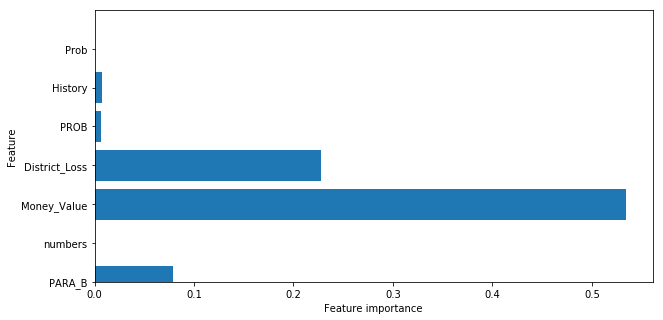

In [149]:
%matplotlib inline
def plot_feature_importances(model):
    plt.figure(figsize = (10,5))
    n_features = X.shape[1]
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), X.columns.values)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.tick_params(axis='y', which='major', labelsize=10)
    plt.ylim(2, n_features)
    

plot_feature_importances(dtree)

### Based on the important features above let us try and optimize the tree

In [150]:
# data sampling    
## Defining a function named "plot_tree" to plot decision tree 

def plot_tree(crit, split, depth , min_split, min_leaf=0.2):
    X_train1, X_test1, y_train1, y_test1 = train_test_split( X, y, test_size = 0.25, random_state = 100)                                            
    X_train1, X_val, y_train1, y_val = train_test_split( X_train1, y_train1, test_size = 0.25, random_state = 100)                           
                           
    labels = X_train1.columns
    
    estimator = DecisionTreeClassifier(random_state = 0  
      , criterion = crit
      , splitter = split
      , max_depth = depth
      , min_samples_split=min_split
      , min_samples_leaf=min_leaf)
    estimator.fit(X_train1, y_train1)   ##Training the model
    predictions = estimator.predict(X_val) ## testing the model on test data
    print("Controlled Decision Tree : Change the above parameters and observe the difference.","\n","To see the effect of pruning, change the tree depth and notice the change in various metrics")
    print("\n")
    ##overfitting check
    print("Scores on training set: {:.3f}".format(estimator.score(X_train1, y_train1)))
    print("Score on validation set: {:.3f}".format(estimator.score(X_val, y_val)))
        ##confusion matrix
    print("\n Confusion Matrix: \n")
    print(confusion_matrix(y_val, predictions))
    print("\n Classification Report: \n")
    print(classification_report(y_val, predictions))
    graph = Source(tree.export_graphviz(estimator
      , out_file=None
      , feature_names=labels, rounded = True, impurity = True
      , filled = True))
   
    display(SVG(graph.pipe(format='svg')))
    return estimator

##using IPython.core.interactiveshel package for better visualization of tree

inter=interactive(plot_tree        ##using plt_tree function in interactive
   , crit = ["gini", "entropy"]
   , split = ["best", "random"]
   , depth=[1,2,3,4,5,6,7,8,9,10,11,12]
   , min_split=(2)
   , min_leaf=5)

In [151]:
display(inter)  

interactive(children=(Dropdown(description='crit', options=('gini', 'entropy'), value='gini'), Dropdown(descri…

### from the above we can see that  decision tree with depth 4 is appropriate for our model , that has also been visualized below

In [152]:

def learning_curve(crit, split, min_split, min_leaf=0.2):
    X_train1, X_test1, y_train1, y_test1 = train_test_split( X, y, test_size = 0.25, random_state = 100)                                            
    X_train1, X_val, y_train1, y_val = train_test_split( X_train1, y_train1, test_size = 0.25, random_state = 100)                           
    labels = X_train1.columns
    
    accuracy_test=[None]*10
    accuracy_train=[None]*10
    count=1
    for max_depth in range(1,10):
        estimator = DecisionTreeClassifier(random_state = 100 
        , criterion = crit
        , splitter = split
        , max_depth = max_depth                                   
        , min_samples_split=min_split
        , min_samples_leaf=min_leaf)
        estimator.fit(X_train1, y_train1)
        accuracy_train[count]=estimator.score(X_train1, y_train1)
        accuracy_test[count]=estimator.score(X_val, y_val)
        count+=1
    plt.figure(figsize = (12,6))
    ax1 = plt.subplot2grid((6,1),(0,0),rowspan=5,colspan=1)
    ax1.plot(range(0,10),accuracy_test)
    ax1.plot(range(0,10),accuracy_train)
    plt.title("Decision Tree | Accuracy vs Tree depth")
    plt.xlabel("Tree Depth")
    plt.ylabel("Accuracy")
    plt.legend(['Test Set','Train Set'])   
    

inter=interactive(learning_curve 
   , crit = ["gini", "entropy"]
   , split = ["best", "random"]
   , min_split=(2)
   , min_leaf=5)
display(inter)                              

interactive(children=(Dropdown(description='crit', options=('gini', 'entropy'), value='gini'), Dropdown(descri…

### Based on the parameters above let us see how our model performs on the test data

In [153]:
X_train1, X_test1, y_train1, y_test1 = train_test_split( X, y, test_size = 0.25, random_state = 100)    

dtree = DecisionTreeClassifier(random_state = 0  
      , criterion = 'gini'
      , splitter = 'best'
      , max_depth = 4
      , min_samples_split=2
      , min_samples_leaf=5)

dtree.fit(X_train1,y_train1)

predictions = dtree.predict(X_test1) ## testing the model on test data
 
##overfitting check
print("Scores on training set: {:.3f}".format(dtree.score(X_train1, y_train1)))
print("Score on test set: {:.3f}".format(dtree.score(X_test1, y_test1)))


    ##confusion matrix
print("\n Confusion Matrix: \n")
print(confusion_matrix(y_test1, predictions))
print("\n Classification Report: \n")
print(classification_report(y_test1, predictions))

Scores on training set: 0.981
Score on test set: 0.969

 Confusion Matrix: 

[[111   1]
 [  5  77]]

 Classification Report: 

              precision    recall  f1-score   support

           0       0.96      0.99      0.97       112
           1       0.99      0.94      0.96        82

   micro avg       0.97      0.97      0.97       194
   macro avg       0.97      0.97      0.97       194
weighted avg       0.97      0.97      0.97       194



### On using tree depth of 4 decision tree also provides us with a good score and recall score of 0.94, i.e. there are only 5 instances of type 2 error in our model

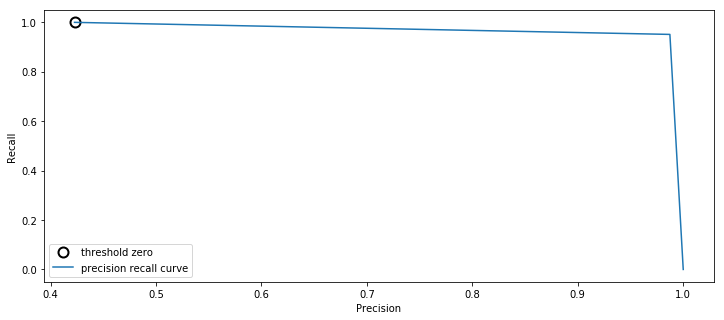

In [154]:
# Recall precision Curve
%matplotlib inline

dtree = DecisionTreeClassifier(random_state = 0  
      , criterion = 'gini'
      , splitter = 'best')



dtree.fit(X_train1, y_train1)
precision, recall, thresholds = precision_recall_curve(y_test1, dtree.predict_proba(X_test1)[:, 1])

# find threshold closest to zero
close_zero = np.argmin(np.abs(thresholds))
plt.figure(figsize = (12,5))
plt.plot(precision[close_zero], recall[close_zero], 'o', markersize=10,
         label="threshold zero", fillstyle="none", c='k', mew=2)

plt.plot(precision, recall, label="precision recall curve")
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(loc="best")
plt.show()



## Step 4 - Evaluation - Classification

## We used various models and identified various parameters based on which we have identified our best classifier model. Let us analyse various parameters in all the models below:

In [155]:
results_classification = pd.read_csv('scores_classification.csv')
results_classification

,Model Name,Train_Score,Avg_Cross_Val Score,Test_Score,Recall Score,Precision,f1-score,Parameter
0,KNN,0.986,0.980,0.960,0.93,0.97,0.95,k = 3
1,Logistic Regression,0.990,0.990,0.990,1.00,0.99,0.99,"C=2000, Penalty = l2"
2,SVM('linear'),0.990,0.990,0.990,1.00,0.99,0.99,C=1000
3,SVM('rbf'),0.980,0.980,0.990,0.99,0.99,0.99,"C=1000, gamma = 0.01"
4,SVM('poly'),0.986,0.986,0.989,1.00,0.99,0.99,"C=1000, degree = 1"
5,Decision Tree,0.980,0.970,0.969,0.94,0.99,0.96,"depth = 4, min_sample_split=2, min_samples_leaf=5"


## On using various parameters for our analysis we see that logistic regressiona and SVM('Linear') provide the best results

In [156]:
# X  = df_ar_cleaned_1
# y  = df_ar_cleaned.Audit_Risk

# #Spliting the data into train and test sets
# X_train_org, X_test_org, y_train, y_test = train_test_split(X, y, random_state=0)

# scaler = StandardScaler()
# scaler.fit(X_train_org)
# X_train = scaler.transform(X_train_org)
# X_test = scaler.transform(X_test_org)
# X_train1, X_test1, y_train1, y_test1 = train_test_split( X, y, test_size = 0.25, random_state = 100)    